# Property Prices: Advanced Regression Techniques

## Goal of the Project

Predict the price of a Property by its features. If you are a buyer or seller of the Property but you don’t know the exact price of the Property, so supervised machine learning regression algorithms can help you to predict the price of the Property just providing features of the target Property.

# <div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Verdana;text-align:center;display:fill;border-radius:5px;background-color:#254E58;overflow:hidden"><b>🎈 Import Essential library 🎈</b></div>

In [1]:
import pandas as pd
import numpy as np
from textblob import TextBlob
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from colorama import Fore, Style
import io
from IPython.display import display
import seaborn as sns
from math import pi
import random
import math
import re
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn import linear_model
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import KFold
from sklearn.metrics import mean_absolute_error
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OrdinalEncoder
from sklearn.linear_model import LinearRegression
import plotly.express as px 
from sklearn.decomposition import PCA
from scipy import stats
from sklearn.model_selection import train_test_split, cross_val_score, KFold
from sklearn.preprocessing import OneHotEncoder, StandardScaler, PolynomialFeatures
from sklearn.impute import SimpleImputer
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
import warnings
warnings.filterwarnings("ignore") 
pd.set_option('display.max_rows', None) 
pd.set_option('display.max_columns', None) 

# Load Dataset

In [2]:
df = pd.read_csv(r"C:\Users\Dell\Desktop\Property_data.csv")

In [3]:
df.head()

,PropertyID,PropertyClass,PropertyZone,PropertyFrontage,PropertySize,Street,Alley,PropertyShape,Elevation,Amenities,Orientation,Grade,Neighborhood,Condition1,Condition2,BldgType,PropertyStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Roof1Material,Roof2Material,ExteriorCladdingType,ExteriorCladdingArea,ExterQual,ExterCond,PropertyFooting,BsmntFinish,BsmntMaintenance,BsmntVisibility,BsmntFinRat1,BsmntFinSty1,BsmntFinQual1,BsmtFinSF2,BsmtUnfSF,BsmntSqFtage,Heating,HeatingEfficiency,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,Bath1,Bath2,BedroomUpLev,KitchenUpLev,KitchenQual,CntRmsUpLev,Functional,CntFireplaces,QualFireplace,BasementType,BasementYrBlt,BasementFinish,BasementCars,BasementSqFootage,BasementQual,BasementCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,BoundaryFeatures,AddFeatures,AddVal,SaleMon,SaleYr,SaleType,SaleCondn,PropPrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


# Sanity check of data

In [4]:
# Check the shape of entire data
rows, cols = df.shape
shape_info = pd.DataFrame({'Property': ['Number of Rows', 'Number of Columns'], 'Value': [rows, cols]})
styled_shape_info = shape_info.style.set_table_styles(
    [
        {'selector': 'thead th', 'props': [('background-color', 'yellow'), ('color', 'red'), ('font-weight', 'bold')]},
        {'selector': 'tbody td', 'props': [('background-color', 'lightblue'), ('color', 'black')]},
        {'selector': 'tbody tr:hover', 'props': [('background-color', 'lime')]},  
        {'selector': 'table', 'props': [('border', '1px solid black')]}
    ]
).set_properties(**{'text-align': 'center'})  
styled_shape_info

,Property,Value
0,Number of Rows,1460
1,Number of Columns,81


In [5]:
#info means it returns all information about the dataframe
buffer = io.StringIO()
df.info(buf=buffer)
info_output = buffer.getvalue()
colors = [
    Style.BRIGHT + Fore.RED, 
    Style.BRIGHT + Fore.GREEN, 
    Style.BRIGHT + Fore.BLUE, 
    Style.BRIGHT + Fore.CYAN, 
    Style.BRIGHT + Fore.MAGENTA, 
    Style.BRIGHT + Fore.YELLOW
]
lines = info_output.split('\n')
formatted_lines = []
for i, line in enumerate(lines):
    if 'Column' in line or 'non-null' in line: 
        color = colors[i % len(colors)]  
        formatted_lines.append(color + line + Style.RESET_ALL)
    else:
        formatted_lines.append(line)
formatted_output = '\n'.join(formatted_lines)
print(formatted_output)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   PropertyID            1460 non-null   int64  
 1   PropertyClass         1460 non-null   int64  
 2   PropertyZone          1460 non-null   object 
 3   PropertyFrontage      1201 non-null   float64
 4   PropertySize          1460 non-null   int64  
 5   Street                1460 non-null   object 
 6   Alley                 91 non-null     object 
 7   PropertyShape         1460 non-null   object 
 8   Elevation             1460 non-null   object 
 9   Amenities             1460 non-null   object 
 10  Orientation           1460 non-null   object 
 11  Grade                 1460 non-null   object 
 12  Neighborhood          1460 non-null   object 
 13  Condition1            1460 non-null   object 
 14  Condition2            1460 non-null   object 
 15  BldgType             

In [6]:
#finding the missing value in percentage of each column
total = df.isnull().sum().sort_values(ascending=False)
percent = (df.isnull().sum() / df.shape[0] * 100).round(2).sort_values(ascending=False)
summary = pd.concat([total, percent], axis=1, keys=['Total null value', 'Percentage of null value'])
summary.style.background_gradient(subset=['Percentage of null value'], cmap='coolwarm')

,Total null value,Percentage of null value
PoolQC,1453,99.520000
AddFeatures,1406,96.300000
Alley,1369,93.770000
BoundaryFeatures,1179,80.750000
ExteriorCladdingType,872,59.730000
QualFireplace,690,47.260000
PropertyFrontage,259,17.740000
BasementYrBlt,81,5.550000
BasementCond,81,5.550000
BasementType,81,5.550000


In [7]:
#finding duplicate value of entire data
df.duplicated().sum()

0

In [8]:
#identify garbage value
for i in df.select_dtypes(include='object').columns:
    print(df[i].value_counts())
    print("***"*5)

PropertyZone
RL         1151
RM          218
FV           65
RH           16
C (all)      10
Name: count, dtype: int64
***************
Street
Pave    1454
Grvl       6
Name: count, dtype: int64
***************
Alley
Grvl    50
Pave    41
Name: count, dtype: int64
***************
PropertyShape
Reg    925
IR1    484
IR2     41
IR3     10
Name: count, dtype: int64
***************
Elevation
Lvl    1311
Bnk      63
HLS      50
Low      36
Name: count, dtype: int64
***************
Amenities
AllPub    1459
NoSeWa       1
Name: count, dtype: int64
***************
Orientation
Inside     1052
Corner      263
CulDSac      94
FR2          47
FR3           4
Name: count, dtype: int64
***************
Grade
Gtl    1382
Mod      65
Sev      13
Name: count, dtype: int64
***************
Neighborhood
NAmes      225
CollgCr    150
OldTown    113
Edwards    100
Somerst     86
Gilbert     79
NridgHt     77
Sawyer      74
NWAmes      73
SawyerW     59
BrkSide     58
Crawfor     51
Mitchel     49
NoRidge     

In [9]:
#finding columns of entire data
colors = [Fore.RED, Fore.GREEN, Fore.BLUE, Fore.CYAN, Fore.MAGENTA, Fore.YELLOW]
colorful_columns = [
    f"{colors[i % len(colors)]}{col}{Style.RESET_ALL}" for i, col in enumerate(df.columns)
]
print("Index(['" + "', '".join(colorful_columns) + "'], dtype='object')")

Index(['PropertyID', 'PropertyClass', 'PropertyZone', 'PropertyFrontage', 'PropertySize', 'Street', 'Alley', 'PropertyShape', 'Elevation', 'Amenities', 'Orientation', 'Grade', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'PropertyStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl', 'Roof1Material', 'Roof2Material', 'ExteriorCladdingType', 'ExteriorCladdingArea', 'ExterQual', 'ExterCond', 'PropertyFooting', 'BsmntFinish', 'BsmntMaintenance', 'BsmntVisibility', 'BsmntFinRat1', 'BsmntFinSty1', 'BsmntFinQual1', 'BsmtFinSF2', 'BsmtUnfSF', 'BsmntSqFtage', 'Heating', 'HeatingEfficiency', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'Bath1', 'Bath2', 'BedroomUpLev', 'KitchenUpLev', 'KitchenQual', 'CntRmsUpLev', 'Functional', 'CntFireplaces', 'QualFireplace', 'BasementType', 'BasementYrBlt', 'BasementFinish', 'BasementCars', 'BasementSqFootage', 'BasementQual', 'BasementCond', '

In [10]:
# finding number of int dtype columns
int_columns = df.select_dtypes(include=["int64"]).columns
print(Style.BRIGHT+Fore.RED + "Total number of integer columns:" + Style.RESET_ALL, Style.BRIGHT+Fore.MAGENTA + str(int_columns.shape[0]) + Style.RESET_ALL)
print(Style.BRIGHT+Fore.RED + "Integer columns name:" + Style.RESET_ALL, Style.BRIGHT+Fore.MAGENTA + str(int_columns.tolist()) + Style.RESET_ALL)


Total number of integer columns: 35
Integer columns name: ['PropertyID', 'PropertyClass', 'PropertySize', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'BsmntFinSty1', 'BsmtFinSF2', 'BsmtUnfSF', 'BsmntSqFtage', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'Bath1', 'Bath2', 'BedroomUpLev', 'KitchenUpLev', 'CntRmsUpLev', 'CntFireplaces', 'BasementCars', 'BasementSqFootage', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'AddVal', 'SaleMon', 'SaleYr', 'PropPrice']


In [11]:
# finding number of Float dtype columns
float_columns = df.select_dtypes(include=["float64"]).columns
print(Style.BRIGHT+Fore.RED + "Total number of Float columns:" + Style.RESET_ALL, Style.BRIGHT+Fore.MAGENTA + str(float_columns.shape[0]) + Style.RESET_ALL)
print(Style.BRIGHT+Fore.RED + "Float columns name:" + Style.RESET_ALL, Style.BRIGHT+Fore.MAGENTA + str(float_columns.tolist()) + Style.RESET_ALL)

Total number of Float columns: 3
Float columns name: ['PropertyFrontage', 'ExteriorCladdingArea', 'BasementYrBlt']


In [12]:
# finding number of categorical dtype columns
cat_columns = df.select_dtypes(include=["object"]).columns
print(Style.BRIGHT+Fore.RED + "Total number of categorical columns:" + Style.RESET_ALL, Style.BRIGHT+Fore.MAGENTA + str(cat_columns.shape[0]) + Style.RESET_ALL)
print(Style.BRIGHT+Fore.RED + "categorical columns name:" + Style.RESET_ALL, Style.BRIGHT+Fore.MAGENTA + str(cat_columns.tolist()) + Style.RESET_ALL)


Total number of categorical columns: 43
categorical columns name: ['PropertyZone', 'Street', 'Alley', 'PropertyShape', 'Elevation', 'Amenities', 'Orientation', 'Grade', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'PropertyStyle', 'RoofStyle', 'RoofMatl', 'Roof1Material', 'Roof2Material', 'ExteriorCladdingType', 'ExterQual', 'ExterCond', 'PropertyFooting', 'BsmntFinish', 'BsmntMaintenance', 'BsmntVisibility', 'BsmntFinRat1', 'BsmntFinQual1', 'Heating', 'HeatingEfficiency', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'QualFireplace', 'BasementType', 'BasementFinish', 'BasementQual', 'BasementCond', 'PavedDrive', 'PoolQC', 'BoundaryFeatures', 'AddFeatures', 'SaleType', 'SaleCondn']


# Feature Engineering

Feature engineering refers to the process of selecting, transforming, and creating features (input variables) from raw data to improve the performance of machine learning models. It involves identifying the most relevant features, modifying them, or even designing new ones to ensure that the model can better capture patterns and relationships in the data.

## Missing Value Treatments

In [13]:
#choose the method of imputing missing value
#like mean,median,mode or Knn imputer

In [14]:
#Replace missing values in categorical columns with the "mode" of each column
for i in ["Electrical","QualFireplace","BsmntFinish","BasementCond","BasementQual","BasementFinish","BsmntFinQual1","BasementType","BsmntFinRat1","BsmntVisibility","BsmntMaintenance","BsmntFinish","ExteriorCladdingType"]:
    df[i].fillna(df[i].mode()[0],inplace= True) 

In [15]:
# Here, we calculated the median value of the "PropertyFrontage" column to fill in the null values.
df["PropertyFrontage"].median()

69.0

In [16]:
#Here, we calculated the mean value of the "ExteriorCladdingArea" column to fill in the null values.
df["ExteriorCladdingArea"].median()

0.0

In [17]:
df["BasementYrBlt"].median()

1980.0

In [18]:
#Replace missing values in Float columns with the "median" of each column.
for i in ["PropertyFrontage","BasementYrBlt","ExteriorCladdingArea"]:
    df[i].fillna(df[i].median(),inplace= True) 

In [19]:
#We observed that after filling the null values in some categorical columns, a few columns are still showing null values 
# We will delete these columns because they have over 90% null values
summary = pd.DataFrame({
    "ColumnName": df.columns,
    "DataType": [df[col].dtype for col in df.columns],
    "NullCount": df.isnull().sum()  
})
columns_with_null = summary[summary["NullCount"] > 0]
styled_columns_with_null = (
    columns_with_null.style
    .background_gradient(subset=["NullCount"], cmap="Reds") 
    .set_properties(subset=["ColumnName"], **{"color": "blue"})  
    .set_properties(**{"font-weight": "bold"})
)
styled_columns_with_null

,ColumnName,DataType,NullCount
Alley,Alley,object,1369
PoolQC,PoolQC,object,1453
BoundaryFeatures,BoundaryFeatures,object,1179
AddFeatures,AddFeatures,object,1406


## Treatments with columns & New features Create

In [20]:
#here change the dtype column of PropPrice int to float
df['PropPrice'] = df['PropPrice'].astype(float)

#here change the dtype column of BasementYrBlt float to int
df['BasementYrBlt'] = df['BasementYrBlt'].astype(int)

#here change the dtype column of PropertyFrontage float to int
df['PropertyFrontage'] = df['PropertyFrontage'].astype(int)

### Property Features

In [21]:
# A new feature, PropertyAge, has been created in this dataset
#It calculates the age of a property based on the year it was sold (SaleYr) and the year it was built (YearBuilt) 
#The formula used for this is
df['PropertyAge'] = df['SaleYr'] - df['YearBuilt']

### TotalArea

In [22]:
# Calculate the total area as new feature based on the PropertySize,WoodDeckSF,OpenPorchSF old feature
df['TotalArea'] = df['PropertySize'] + df['WoodDeckSF'] + df['OpenPorchSF']

### Property Conditions and Amenities

In [23]:
# Finding the HasDeckOrPorch
df['HasDeckOrPorch'] = ((df['WoodDeckSF'] > 0) | (df['OpenPorchSF'] > 0)).astype(int)

### BedroomToBathroomRatio

In [24]:
# Calculate the BedroomToBathroomRatio
df['BedroomToBathroomRatio'] = df['BedroomUpLev'] // (df['Bath1'] + df['Bath2'])

### PricePerSqFt

In [25]:
# Calculate the PricePerSqFt
df['PricePerSqFt'] = df['PropPrice'] / df['PropertySize']
df['PricePerSqFt'] = df['PricePerSqFt'].round(2)

### TotalBathrooms

In [26]:
# Calculate the no of bathroom
df['TotalBathrooms'] = (df['Bath1'] + df['Bath2'] + (df['BsmtFullBath'] + 0.5 * df['BsmtHalfBath'])).astype(int)

### TotalSF

In [27]:
#Create the 'TotalSF' column
df['TotalSF'] = df['1stFlrSF'] + df['2ndFlrSF']

### Change the Dtypes format int32 to int64

In [28]:
columns_to_convert = ['PropertyFrontage', 'BasementYrBlt', 'HasDeckOrPorch','TotalBathrooms']
df[columns_to_convert] = df[columns_to_convert].astype('int64')
print("\nAfter conversion:")
print(df.dtypes)


After conversion:
PropertyID                  int64
PropertyClass               int64
PropertyZone               object
PropertyFrontage            int64
PropertySize                int64
Street                     object
Alley                      object
PropertyShape              object
Elevation                  object
Amenities                  object
Orientation                object
Grade                      object
Neighborhood               object
Condition1                 object
Condition2                 object
BldgType                   object
PropertyStyle              object
OverallQual                 int64
OverallCond                 int64
YearBuilt                   int64
YearRemodAdd                int64
RoofStyle                  object
RoofMatl                   object
Roof1Material              object
Roof2Material              object
ExteriorCladdingType       object
ExteriorCladdingArea      float64
ExterQual                  object
ExterCond                  ob

### Deleted columns

In [29]:
# Here, we have deleted some columns that have more than 90% values 
#and removed a few features that are not important, and renamed some features
df1 = df.drop(columns=['PropertyID','Alley','PoolQC','BoundaryFeatures','AddFeatures','1stFlrSF','2ndFlrSF','Bath1','Roof2Material','Condition2','Bath2','SaleCondn','SaleType','RoofMatl','BsmntVisibility','BsmntFinSty1','BsmtFinSF2','BsmntFinQual1','BasementSqFootage','3SsnPorch','OpenPorchSF','EnclosedPorch','ScreenPorch','SaleMon','ExterQual'], axis=1).rename(columns = {'Condition1':'Condition',
                          'Roof1Material':'RoofMaterial','PropPrice':'SalePrice'})

In [30]:
# I am dropping the column 'BedroomToBathroomRatio' because it contains infinity values
df2 = df1.drop(columns=['BedroomToBathroomRatio'], axis=1)

In [31]:
# After deleting some columns, we checked for null values and found that null values 
null_counts = df2.isnull().sum()
for column, count in null_counts.items():
    if count > 0:
        print(Fore.YELLOW + Style.BRIGHT + f"{column}: {count}" + Style.RESET_ALL)  
    else:
        print(Fore.BLUE + Style.BRIGHT + f"{column}: {count}" + Style.RESET_ALL)

PropertyClass: 0
PropertyZone: 0
PropertyFrontage: 0
PropertySize: 0
Street: 0
PropertyShape: 0
Elevation: 0
Amenities: 0
Orientation: 0
Grade: 0
Neighborhood: 0
Condition: 0
BldgType: 0
PropertyStyle: 0
OverallQual: 0
OverallCond: 0
YearBuilt: 0
YearRemodAdd: 0
RoofStyle: 0
RoofMaterial: 0
ExteriorCladdingType: 0
ExteriorCladdingArea: 0
ExterCond: 0
PropertyFooting: 0
BsmntFinish: 0
BsmntMaintenance: 0
BsmntFinRat1: 0
BsmtUnfSF: 0
BsmntSqFtage: 0
Heating: 0
HeatingEfficiency: 0
CentralAir: 0
Electrical: 0
LowQualFinSF: 0
GrLivArea: 0
BsmtFullBath: 0
BsmtHalfBath: 0
BedroomUpLev: 0
KitchenUpLev: 0
KitchenQual: 0
CntRmsUpLev: 0
Functional: 0
CntFireplaces: 0
QualFireplace: 0
BasementType: 0
BasementYrBlt: 0
BasementFinish: 0
BasementCars: 0
BasementQual: 0
BasementCond: 0
PavedDrive: 0
WoodDeckSF: 0
PoolArea: 0
AddVal: 0
SaleYr: 0
SalePrice: 0
PropertyAge: 0
TotalArea: 0
HasDeckOrPorch: 0
PricePerSqFt: 0
TotalBathrooms: 0
TotalSF: 0


In [32]:
#finding the missing value in percentage of each column
total = df2.isnull().sum().sort_values(ascending=False)
percent = (df2.isnull().sum() / df2.shape[0] * 100).round(2).sort_values(ascending=False)
summary = pd.concat([total, percent], axis=1, keys=['Total null value', 'Percentage of null value'])
summary.style.background_gradient(subset=['Percentage of null value'], cmap='coolwarm')

,Total null value,Percentage of null value
PropertyClass,0,0.000000
BasementFinish,0,0.000000
LowQualFinSF,0,0.000000
GrLivArea,0,0.000000
BsmtFullBath,0,0.000000
BsmtHalfBath,0,0.000000
BedroomUpLev,0,0.000000
KitchenUpLev,0,0.000000
KitchenQual,0,0.000000
CntRmsUpLev,0,0.000000


### After fill all null value fo the column there is no null value any columns

In [33]:
#finding columns after feature Engineering of entire data
colors = [Fore.RED, Fore.GREEN, Fore.BLUE, Fore.CYAN, Fore.MAGENTA, Fore.YELLOW]
colorful_columns = [
    f"{colors[i % len(colors)]}{col}{Style.RESET_ALL}" for i, col in enumerate(df2.columns)
]
print("Index(['" + "', '".join(colorful_columns) + "'], dtype='object')")

Index(['PropertyClass', 'PropertyZone', 'PropertyFrontage', 'PropertySize', 'Street', 'PropertyShape', 'Elevation', 'Amenities', 'Orientation', 'Grade', 'Neighborhood', 'Condition', 'BldgType', 'PropertyStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMaterial', 'ExteriorCladdingType', 'ExteriorCladdingArea', 'ExterCond', 'PropertyFooting', 'BsmntFinish', 'BsmntMaintenance', 'BsmntFinRat1', 'BsmtUnfSF', 'BsmntSqFtage', 'Heating', 'HeatingEfficiency', 'CentralAir', 'Electrical', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'BedroomUpLev', 'KitchenUpLev', 'KitchenQual', 'CntRmsUpLev', 'Functional', 'CntFireplaces', 'QualFireplace', 'BasementType', 'BasementYrBlt', 'BasementFinish', 'BasementCars', 'BasementQual', 'BasementCond', 'PavedDrive', 'WoodDeckSF', 'PoolArea', 'AddVal', 'SaleYr', 'SalePrice', 'PropertyAge', 'TotalArea', 'HasDeckOrPorch', 'PricePerSqFt', 'TotalBathrooms', 'TotalSF'], dtype='object')


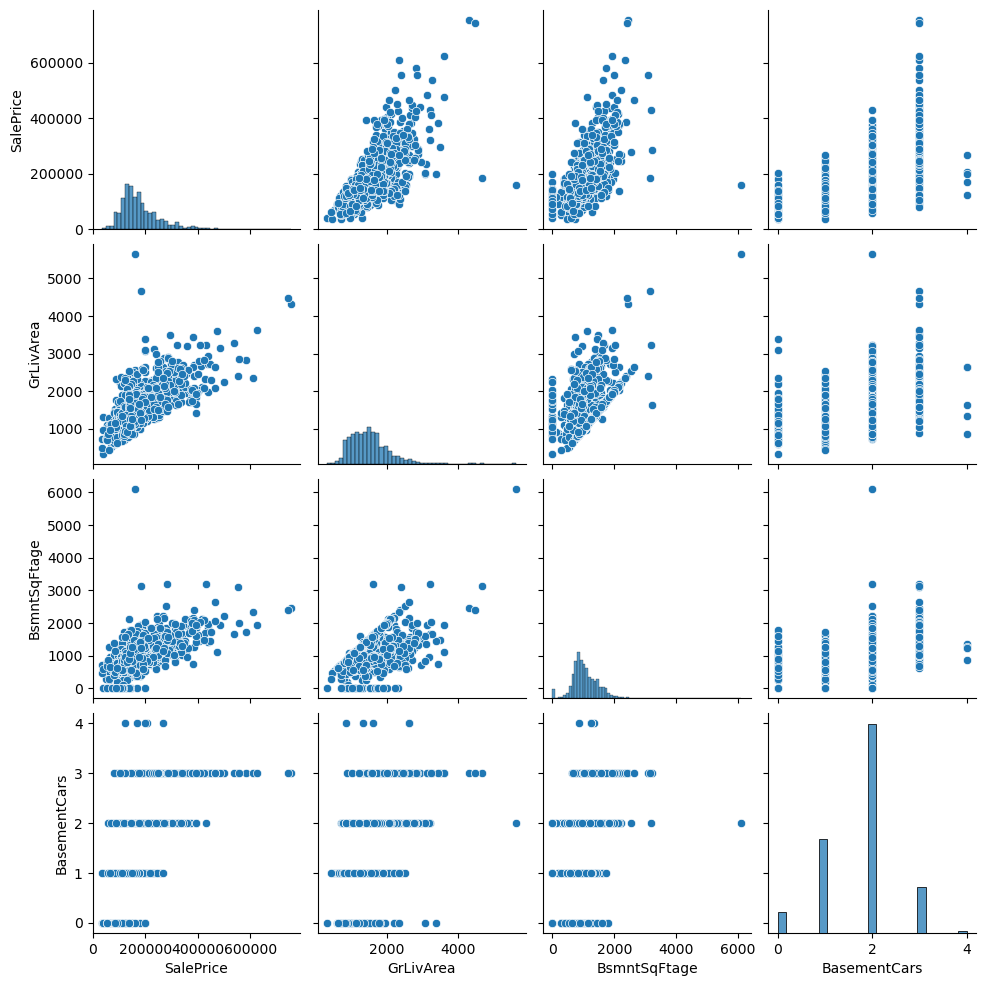

In [34]:
# I checked how the data appears here 
sns.pairplot(df2, vars=['SalePrice', 'GrLivArea', 'BsmntSqFtage', 'BasementCars'], palette='coolwarm')
plt.show()

## Insights from the Chart

SalePrice vs. GrLivArea: There's a positive correlation—higher above-ground living area leads to higher sale prices.

SalePrice vs. BsmtSqFtAge: Larger basement square footage is linked to increased sale prices.

SalePrice vs. BasementCars: Houses with more basement car spaces tend to have higher sale prices.

GrLivArea vs. BsmtSqFtAge: Larger living areas often coincide with larger basement areas.

GrLivArea vs. BasementCars: There’s a weak positive correlation—houses with bigger living areas might have more car spaces.

BsmtSqFtAge vs. BasementCars: Larger basements may accommodate more car spaces, though the relationship is weaker.

The chart provides key insights into the relationships between variables, along with market trends. Here's a breakdown in English:

Market Trends:
Bigger living areas and basements typically attract higher sale prices.
Properties with greater basement parking capacity also hold more value.
The general trend indicates that spacious homes—both above-ground and underground—are highly valued in the real estate market

# Exploratory Data Analysis(EDA)

In [35]:
# finding Descriptive Statistics of dataset
describe_transposed = df2.describe().T
styled_df2 = describe_transposed.style.background_gradient(cmap='hsv')
styled_df2

,count,mean,std,min,25%,50%,75%,max
PropertyClass,1460.000000,56.897260,42.300571,20.000000,20.000000,50.000000,70.000000,190.000000
PropertyFrontage,1460.000000,69.863699,22.027677,21.000000,60.000000,69.000000,79.000000,313.000000
PropertySize,1460.000000,10516.828082,9981.264932,1300.000000,7553.500000,9478.500000,11601.500000,215245.000000
OverallQual,1460.000000,6.099315,1.382997,1.000000,5.000000,6.000000,7.000000,10.000000
OverallCond,1460.000000,5.575342,1.112799,1.000000,5.000000,5.000000,6.000000,9.000000
YearBuilt,1460.000000,1971.267808,30.202904,1872.000000,1954.000000,1973.000000,2000.000000,2010.000000
YearRemodAdd,1460.000000,1984.865753,20.645407,1950.000000,1967.000000,1994.000000,2004.000000,2010.000000
ExteriorCladdingArea,1460.000000,103.117123,180.731373,0.000000,0.000000,0.000000,164.250000,1600.000000
BsmtUnfSF,1460.000000,567.240411,441.866955,0.000000,223.000000,477.500000,808.000000,2336.000000
BsmntSqFtage,1460.000000,1057.429452,438.705324,0.000000,795.750000,991.500000,1298.250000,6110.000000


In [36]:
# finding object column descriptive analysis
desc_stats = df2.describe(include="object").T
def generate_bright_color():
    return f"#{random.randint(100, 255):02x}{random.randint(100, 255):02x}{random.randint(100, 255):02x}"
row_colors = [
    {'selector': f'tr:nth-of-type({i+1})',
     'props': [('background-color', generate_bright_color()), ('color', 'black')]}
    for i in range(len(desc_stats))
]
styled_output = desc_stats.style.set_table_styles(row_colors)
display(styled_output)

,count,unique,top,freq
PropertyZone,1460,5,RL,1151
Street,1460,2,Pave,1454
PropertyShape,1460,4,Reg,925
Elevation,1460,4,Lvl,1311
Amenities,1460,2,AllPub,1459
Orientation,1460,5,Inside,1052
Grade,1460,3,Gtl,1382
Neighborhood,1460,25,NAmes,225
Condition,1460,9,Norm,1260
BldgType,1460,5,1Fam,1220


# Outliers Detection

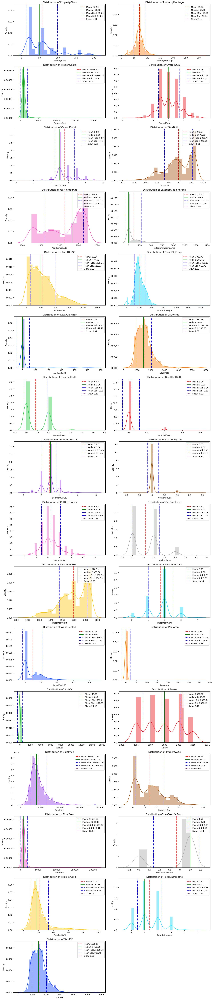

In [37]:
#Here we are checking the data through distplot to see how much each column is skewed
numeric_cols = df2.select_dtypes(include=['number']).columns
plt.figure(figsize=(15, 70))
for i, col in enumerate(numeric_cols):
    ax = plt.subplot(len(numeric_cols) // 2 + 1, 2, i + 1)
    
    sns.distplot(df2[col], 
                 color=sns.color_palette("bright", len(numeric_cols))[i], 
                 kde=True,
                 ax=ax)
    ax.set_title(f'Distribution of {col}')
    
    mean = df2[col].mean()
    std_dev = df2[col].std()
    median = df2[col].median()
    skewness = df2[col].skew()
    
    ax.axvline(mean, color='red', linestyle='--', label=f'Mean: {mean:.2f}')
    ax.axvline(median, color='green', linestyle='-', label=f'Median: {median:.2f}')
    ax.axvline(mean + std_dev, color='blue', linestyle='-.', label=f'Mean+Std: {mean + std_dev:.2f}')
    ax.axvline(mean - std_dev, color='blue', linestyle='-.', label=f'Mean-Std: {mean - std_dev:.2f}')
    skew_line = Line2D([], [], color='purple', linestyle=':', label=f'Skew: {skewness:.2f}')
    handles, labels = ax.get_legend_handles_labels()
    handles.append(skew_line)
    labels.append(f'Skew: {skewness:.2f}')
    
    ax.legend(handles=handles, loc='upper right')

plt.tight_layout()
plt.show()

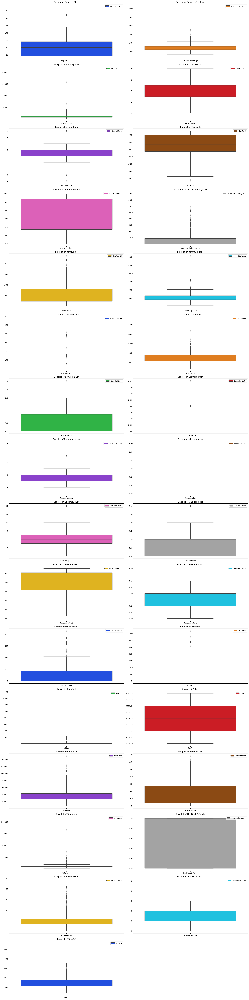

In [38]:
#Here, we have checked for outliers using a boxplot
numeric_cols = df2.select_dtypes(include=['number']).columns

num_rows = (len(numeric_cols) + 1) // 2

fig, axes = plt.subplots(ncols=2, nrows=num_rows, figsize=(20, num_rows * 5))
for i, col in enumerate(numeric_cols):
    sns.boxplot(data=df2[[col]], ax=axes[i//2][i%2], color=sns.color_palette("bright", len(numeric_cols))[i])
    axes[i//2][i%2].set_title(f'Boxplot of {col}')
    axes[i//2][i%2].legend([col], loc='upper right')
for j in range(len(numeric_cols), num_rows * 2):
    fig.delaxes(axes.flatten()[j])
plt.tight_layout()
plt.show()

In [39]:
# We have found outliers in all the columns here, so we will cap them.

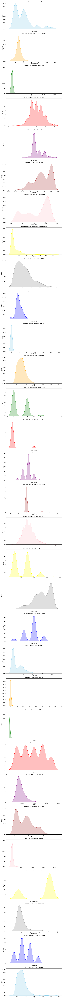

In [40]:
# Plot Probability Density Plot (Kernel Density Estimation) for each numerical column
colors = ['skyblue', 'orange', 'green', 'red', 'purple', 'brown', 'pink', 'yellow', 'gray', 'blue']
num_cols = len(df2.select_dtypes(include=['number']).columns)
fig, axes = plt.subplots(num_cols, 1, figsize=(10, 5*num_cols))
for i, col in enumerate(df2.select_dtypes(include=['int', 'float']).columns):
    color = colors[i % len(colors)]  
    sns.kdeplot(data=df2[col], ax=axes[i], color=color, shade=True)
    axes[i].set_title(f'Probability Density Plot of {col}')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Density')
plt.tight_layout()
plt.show()

In [41]:
# Here, we have calculated the number of outliers for each column
num_cols = df2.select_dtypes(include='number')

# Calculate Quartiles and IQR
Q1 = num_cols.quantile(0.25)
Q3 = num_cols.quantile(0.75)
IQR = Q3 - Q1
outliers = ((num_cols < (Q1 - 1.5 * IQR)) | (num_cols > (Q3 + 1.5 * IQR)))
num_outliers = outliers.sum()
color_mapping = {
    "red": "\033[1;91m",       
    "yellow": "\033[1;93m",    
    "green": "\033[1;92m",     
    "cyan": "\033[1;96m",      
    "blue": "\033[1;94m",      
    "magenta": "\033[1;95m",   
    "white": "\033[1;97m"     
}
reset_color = "\033[0m"  
color_names = ["red", "yellow", "green", "cyan", "blue", "magenta", "white"]
print("Columns with potential outliers:")
for i, (column, count) in enumerate(num_outliers.items()):
    if count > 0:  
        color_name = color_names[i % len(color_names)]  
        row_color = color_mapping[color_name] 
        print(f"{row_color}{column}: {count} outliers{reset_color}")

Columns with potential outliers:
PropertyClass: 103 outliers
PropertyFrontage: 106 outliers
PropertySize: 69 outliers
OverallQual: 2 outliers
OverallCond: 125 outliers
YearBuilt: 7 outliers
ExteriorCladdingArea: 98 outliers
BsmtUnfSF: 29 outliers
BsmntSqFtage: 61 outliers
LowQualFinSF: 26 outliers
GrLivArea: 31 outliers
BsmtFullBath: 1 outliers
BsmtHalfBath: 82 outliers
BedroomUpLev: 35 outliers
KitchenUpLev: 68 outliers
CntRmsUpLev: 30 outliers
CntFireplaces: 5 outliers
BasementYrBlt: 1 outliers
BasementCars: 5 outliers
WoodDeckSF: 32 outliers
PoolArea: 7 outliers
AddVal: 52 outliers
SalePrice: 61 outliers
PropertyAge: 8 outliers
TotalArea: 64 outliers
PricePerSqFt: 120 outliers
TotalBathrooms: 9 outliers
TotalSF: 28 outliers


# Capping outliers

In [42]:
#calculate no percentiles for each numeric variable
df2.describe(percentiles=[])

,PropertyClass,PropertyFrontage,PropertySize,OverallQual,OverallCond,YearBuilt,YearRemodAdd,ExteriorCladdingArea,BsmtUnfSF,BsmntSqFtage,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,BedroomUpLev,KitchenUpLev,CntRmsUpLev,CntFireplaces,BasementYrBlt,BasementCars,WoodDeckSF,PoolArea,AddVal,SaleYr,SalePrice,PropertyAge,TotalArea,HasDeckOrPorch,PricePerSqFt,TotalBathrooms,TotalSF
count,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,56.897260,69.863699,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.117123,567.240411,1057.429452,5.844521,1515.463699,0.425342,0.057534,2.866438,1.046575,6.517808,0.613014,1978.589041,1.767123,94.244521,2.758904,43.489041,2007.815753,180921.195890,36.547945,10657.732877,0.730137,21.069849,2.374658,1509.619178
std,42.300571,22.027677,9981.264932,1.382997,1.112799,30.202904,20.645407,180.731373,441.866955,438.705324,48.623081,525.480383,0.518911,0.238753,0.815778,0.220338,1.625393,0.644666,23.997022,0.747315,125.338794,40.177307,496.123024,1.328095,79442.502883,30.250152,10009.418061,0.444041,12.387514,0.921178,521.163523
min,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,2006.000000,34900.000000,0.000000,1450.000000,0.000000,1.390000,1.000000,334.000000
50%,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,477.500000,991.500000,0.000000,1464.000000,0.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,0.000000,0.000000,0.000000,2008.000000,163000.000000,35.000000,9600.000000,1.000000,17.855000,2.000000,1458.000000
max,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,2336.000000,6110.000000,572.000000,5642.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,857.000000,738.000000,15500.000000,2010.000000,755000.000000,136.000000,215245.000000,1.000000,95.380000,6.000000,5642.000000


In [43]:
print(df2.SalePrice.describe(percentiles = [0.25,0.50,0.75,0.85,0.90,1]))

count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
85%      250000.000000
90%      278000.000000
100%     755000.000000
max      755000.000000
Name: SalePrice, dtype: float64


In [44]:
# Here, outliers have been capped using the IQR (Interquartile Range) method for each column
# Here, we have skipped the columns where the IQR (Interquartile Range) variability is 0 because it was causing all the values in those columns to be converted to 0

numerical_columns = df2.select_dtypes(include=['number']).columns

def cap_outliers(df2, column):
    Q1 = df2[column].quantile(0.25)
    Q3 = df2[column].quantile(0.75)
    IQR = Q3 - Q1
    if IQR == 0:
        print(Fore.RED + f"Skipping column '{column}' as it has no variability (IQR=0).")
        print(Style.RESET_ALL) 
        return df2[column]
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    capped = np.where(df2[column] < lower_bound, lower_bound,
                      np.where(df2[column] > upper_bound, upper_bound, df2[column]))
    print(Fore.GREEN + f"Capped values for column '{column}' using IQR method.")
    print(Style.RESET_ALL)  
    return capped.astype(df2[column].dtype)

for column in numerical_columns:
    df2[column] = cap_outliers(df2, column)

print(Fore.CYAN + str(df2.describe()))
print(Style.RESET_ALL) 

Capped values for column 'PropertyClass' using IQR method.

Capped values for column 'PropertyFrontage' using IQR method.

Capped values for column 'PropertySize' using IQR method.

Capped values for column 'OverallQual' using IQR method.

Capped values for column 'OverallCond' using IQR method.

Capped values for column 'YearBuilt' using IQR method.

Capped values for column 'YearRemodAdd' using IQR method.

Capped values for column 'ExteriorCladdingArea' using IQR method.

Capped values for column 'BsmtUnfSF' using IQR method.

Capped values for column 'BsmntSqFtage' using IQR method.

Skipping column 'LowQualFinSF' as it has no variability (IQR=0).

Capped values for column 'GrLivArea' using IQR method.

Capped values for column 'BsmtFullBath' using IQR method.

Skipping column 'BsmtHalfBath' as it has no variability (IQR=0).

Capped values for column 'BedroomUpLev' using IQR method.

Skipping column 'KitchenUpLev' as it has no variability (IQR=0).

Capped values for column 'CntRmsU

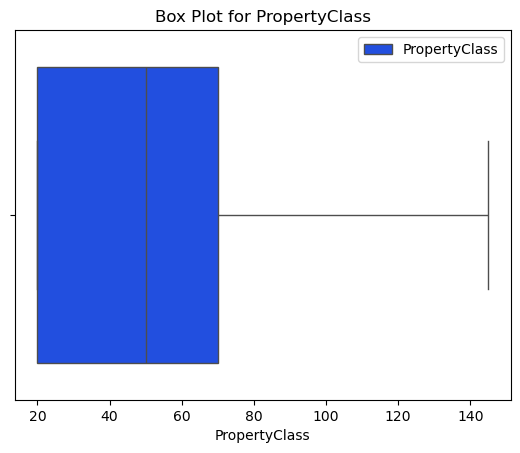

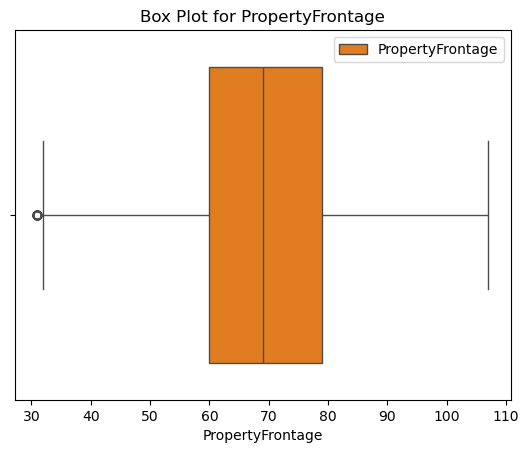

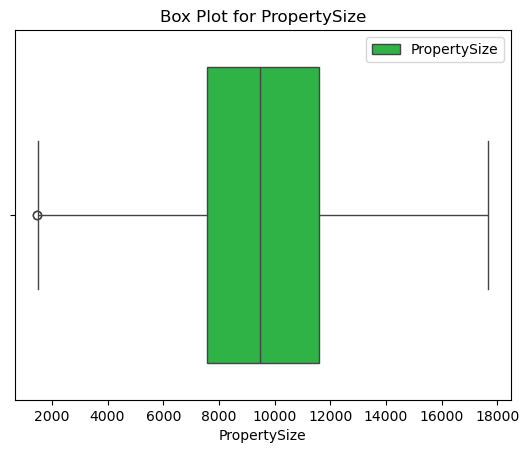

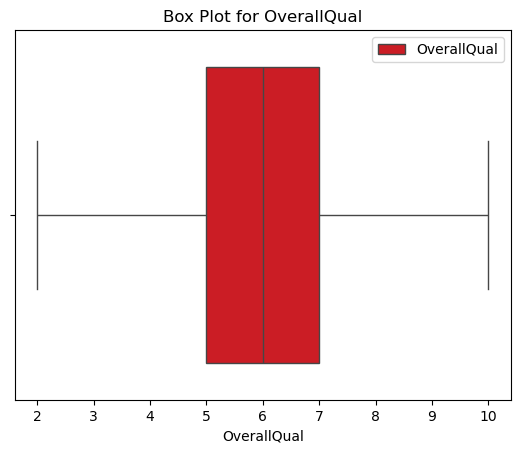

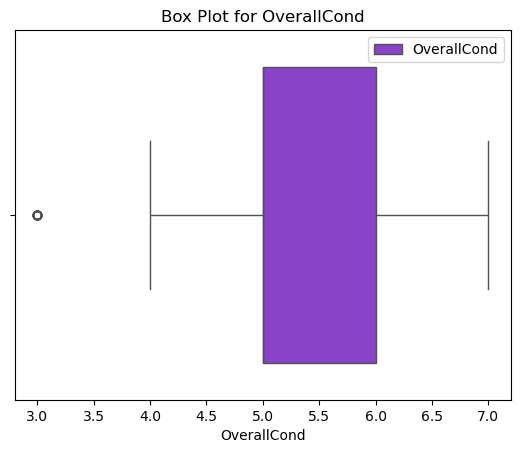

...

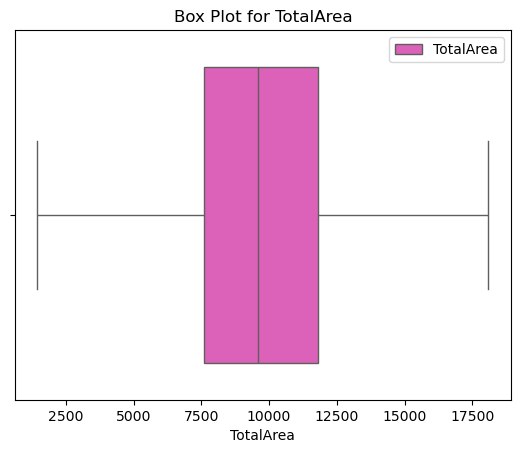

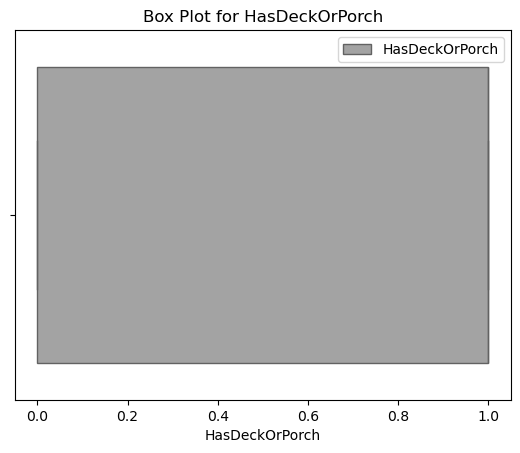

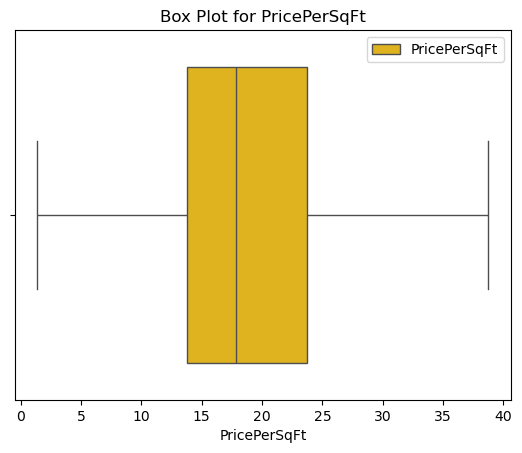

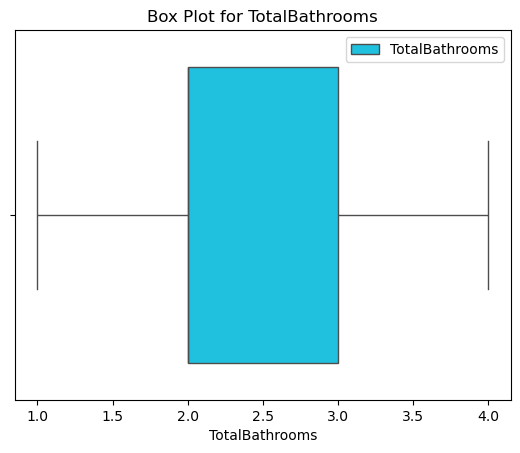

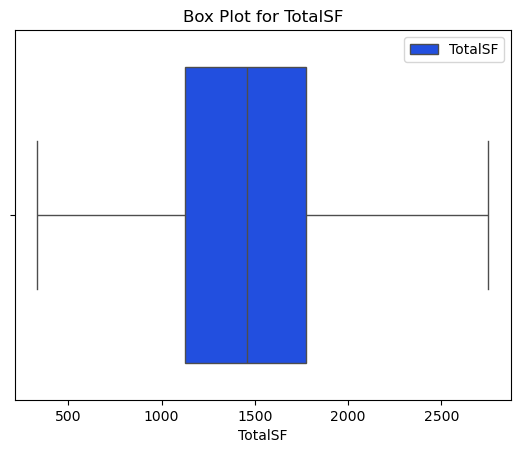

In [45]:
# After capping outliers checking through boxplot 
numeric_columns = df2.select_dtypes(include=['number']).columns

colors = sns.color_palette("bright", len(numeric_columns))

for i, column in enumerate(numeric_columns):
    plt.figure()
    sns.boxplot(x=df2[column], color=colors[i])
    plt.legend([column], loc='upper right')
    plt.title(f'Box Plot for {column}')
    plt.show()

# Visualizing of Features

## Univariate Analysis

Univariate analysis in Python focuses on analyzing a single variable at a time. 
It is used to describe and summarize the distribution of the variable, identify patterns, and detect outliers.
The type of analysis and visualization techniques used depend on whether the variable is categorical or continuous. 

### Distribution of Sale Price

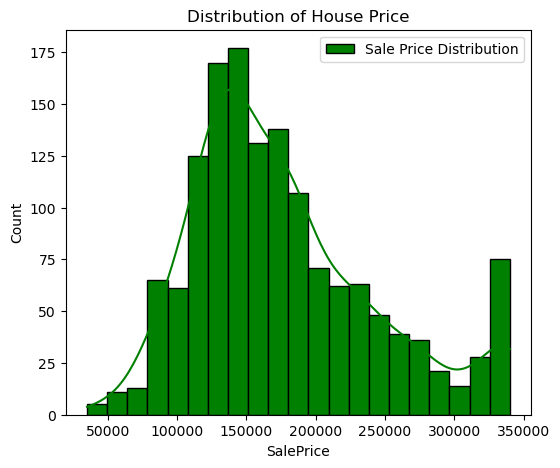

In [46]:
# Distribution of Sale Price through histplot
plt.figure(figsize=(6,5))
sns.histplot(df2['SalePrice'], kde=True, facecolor='Green', edgecolor="Black", label="Sale Price Distribution")
plt.title("Distribution of House Price")
plt.legend(loc='best')
plt.show()

# Insights

Price Concentration: Most houses are sold within the price range of ₹1,00,000 to ₹2,00,000, with a peak around ₹1,50,000. This indicates a strong demand for mid-range properties.

High-End Market: There's a noticeable drop in sales as prices exceed ₹2,00,000, suggesting limited demand for high-priced houses. However, a small spike at ₹3,50,000 hints at a niche market for premium properties.

Distribution Shape: The right-skewed distribution curve suggests that while most houses are sold at lower prices, a few high-priced properties pull the average price upward.

Market Trends

Affordable Housing: The concentration of sales in the mid-range price bracket reflects a growing demand for affordable housing options.

Luxury Segment: The small spike in high-end property sales could indicate emerging interest in luxury housing, possibly driven by affluent buyers or specific market conditions.

Market Polarization: The sharp decline in sales beyond ₹2,00,000 highlights a polarized market, with limited activity in the upper price ranges.


### Count of Properties by BasementType'

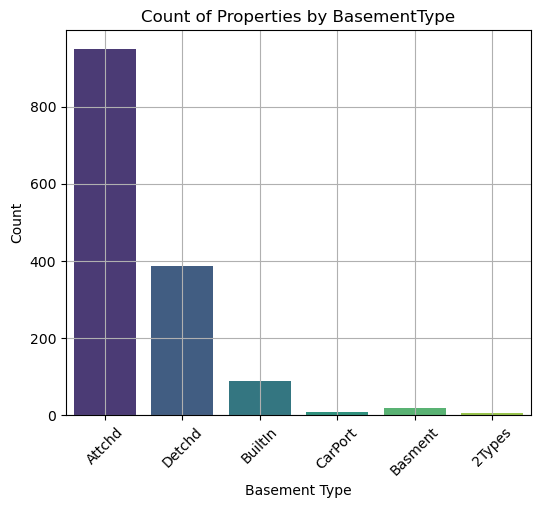

In [47]:
plt.figure(figsize=(6, 5))
sns.countplot(data=df2, x='BasementType', palette='viridis')
plt.title('Count of Properties by BasementType')
plt.xlabel('Basement Type')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

# Insights 

Dominance of Attached Basements: Attached basement types account for the majority, with nearly 900 properties. This suggests that attached basements are widely preferred or more commonly available.

Popularity of Detached Basements: Detached basements are the second most common, with a count of around 400. They also hold a significant portion of the market.

Scarcity of Other Types: Built-in, CarPort, Basment, and 2Types categories have substantially fewer properties, each with a count below 100. These types might cater to niche demands or represent less conventional choices.

Preference for Conventional Basements: The prevalence of attached and detached basements indicates a market trend favoring traditional options, possibly due to their functionality or affordability.

Niche Market for Unique Types: The low counts for Built-in, CarPort, and Basment types could signal niche markets or limited availability. This might be an opportunity for targeted development or innovation.

Growth Potential in Secondary Basement Types: The smaller segments might represent untapped opportunities for developers aiming to diversify offerings or cater to unique buyer needs.

### Number of house built over the year

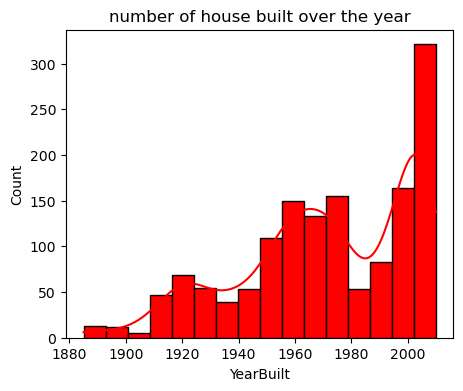

In [48]:
plt.figure(figsize=(5,4))
sns.histplot(df2['YearBuilt'],kde=True,facecolor='red',edgecolor='black')
plt.title('number of house built over the year')
plt.show()

# Insights 

Increased Construction Activity Post-2000: The number of houses built surged significantly after 2000, with counts exceeding 300. This reflects a booming housing market in recent years.

Historical Peaks: Notable increases in house construction are visible around 1960 and 1980, suggesting specific factors like economic growth or urbanization during those periods.

Early Years: From 1880 to the mid-1900s, the number of houses built remained relatively low, indicating limited development activity or smaller population demands.

Urbanization Growth: The upward trend in house construction aligns with urbanization and population growth, especially in the early 21st century.

Demand for Modern Housing: Post-2000 growth could indicate rising demand for newer housing designs, updated amenities, and energy-efficient structures.

Potential for Heritage Renovation: Older properties from 1880 to 1950 may represent opportunities for renovation or preservation, appealing to buyers interested in historical charm.

Fluctuations: While the overall trend is upward, there are periods of fluctuation, indicating that construction activity was not consistent every year.

Overall, the graph shows that housing development has progressively increased, with a substantial surge around the year 2000, reflecting changes in economic, social, and technological factors.

### Overall Quality of house

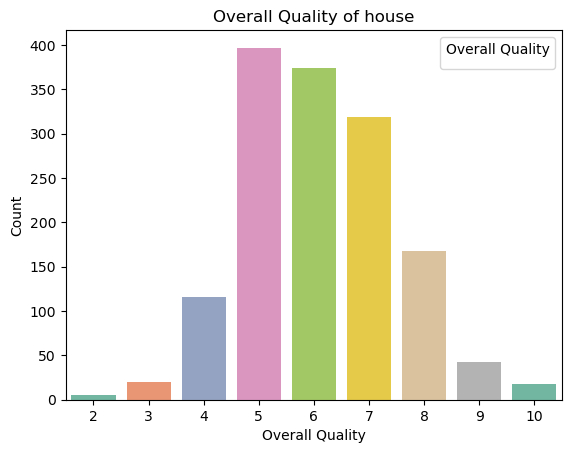

In [49]:
color_palette = sns.color_palette('Set2')
sns.countplot(x='OverallQual', data=df2, palette=color_palette)
plt.title('Overall Quality of house')
plt.xlabel('Overall Quality')
plt.ylabel('Count')
handles, labels = plt.gca().get_legend_handles_labels()
plt.legend(handles, labels, title='Overall Quality', loc='upper right')
plt.show()

# Insights 

Dominance of Mid-Range Quality: Most houses fall within the quality ratings of 4 to 7, with rating 5 being the most common (close to 400 houses). This suggests a market preference for average-quality homes.

Moderate Representation: Quality ratings 4 and 8 have moderate counts, indicating a steady demand for slightly below-average and above-average quality homes.

Rarity of Extremes: High-quality houses (ratings 9 and 10) and low-quality houses (ratings 2 and 3) are rare, with counts below 50. This could indicate limited supply or niche demand for these categories.

Focus on Mid-Quality Homes: The market seems to cater primarily to mid-range quality homes, which could be due to affordability and broader appeal.

Opportunity for Premium Housing: The scarcity of high-quality houses suggests a potential niche market for premium homes, which could be explored by developers targeting affluent buyers.

Limited Low-Quality Housing: The low count of poor-quality houses might indicate a market trend towards maintaining or upgrading housing standards.

Consumer Preferences or Market Dynamics: The low number of very high-quality (9 and 10) and very low-quality (2 and 3) houses could reflect.Limited supply due to high costs of premium housing or strict quality regulations.Low demand for poor-quality houses due to improved living standards or renovation trends. 

Cultural and Regional Influences: In some areas, there might be cultural or lifestyle factors influencing quality preferences. For example, homeowners might prioritize land value or location over house quality in certain regions.


### Distibution of PropertyFrontage

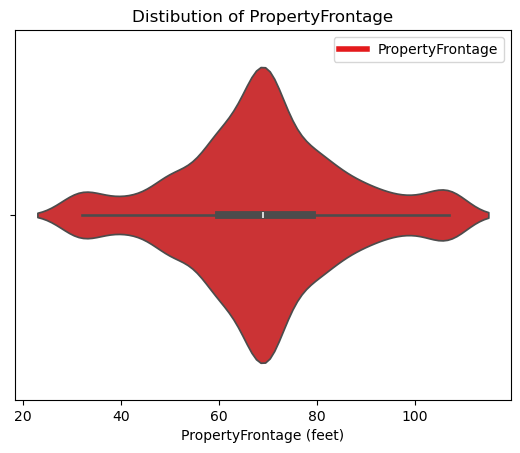

In [50]:
color_palette = sns.color_palette('Set1')
sns.violinplot(x=df2['PropertyFrontage'], palette=color_palette)
plt.title('Distibution of PropertyFrontage')
plt.xlabel('PropertyFrontage (feet)')
handles = [plt.Line2D([0], [0], color=color_palette[0], lw=4)]
labels = ['PropertyFrontage']
plt.legend(handles, labels, loc='upper right')
plt.show()

# Insights 

Wide Spread in Property Frontage: The x-axis ranges from 20 feet to 120 feet, indicating a wide variety in lot sizes. This broad spread may reflect diverse housing needs and property values.

Density Peaks: The density appears highest within a certain range (likely around 50-80 feet), signifying that most properties fall within this frontage zone. This could suggest a preference for mid-sized lots among buyers.

Median and Quartile Spread: The box plot within the violin plot shows the median and interquartile range, providing further information.A compact range might highlight stable pricing or demand in that segment.A wide spread could imply greater variability in property values and preferences.

Dominance of Mid-Sized Properties: The density peak suggests a strong demand for properties with mid-sized frontages (50-80 feet), reflecting an affordable, family-friendly housing market.

Premium Demand for Larger Frontages: The scarcity of properties with frontages over 100 feet indicates a niche market opportunity for luxury homes or spacious developments.

Compact Lot Housing Trends: Increasing urbanization may drive demand for smaller lot sizes (below 40 feet), especially in high-density areas or for first-time buyers.

Potential for Customization: Developers could focus on properties within the interquartile range to meet mainstream demand while offering upgrades to appeal to premium buyers.

Regional Impacts: The frontage distribution may vary geographically. Urban areas might lean towards compact lots, while suburban and rural regions favor larger frontages.

Hidden Patterns in Extremes: Properties with very small frontages (below 30 feet) may reflect a trend toward compact urban housing or tightly packed developments. Conversely, properties with large frontages (above 100 feet) could signify suburban luxury estates or rural retreats.



### Density Plot of Price Per Square Foot

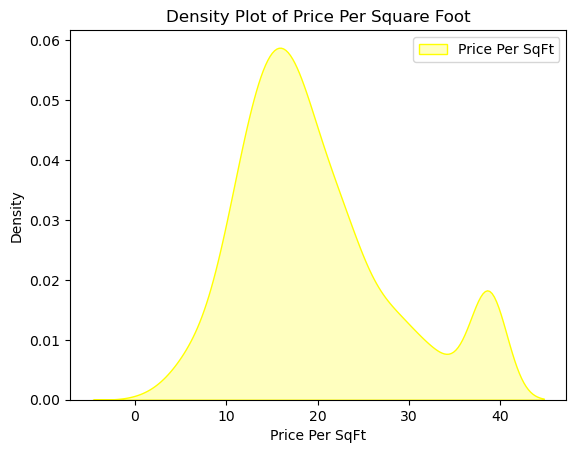

In [51]:
sns.kdeplot(df2['PricePerSqFt'], shade=True, color='yellow', label='Price Per SqFt')
plt.title('Density Plot of Price Per Square Foot')
plt.xlabel('Price Per SqFt')
plt.ylabel('Density')
plt.legend()
plt.show()

# Insights 

Primary Price Concentration: The highest density is around 20 (price per square foot), indicating that this is the most common price point in the market. It could signify the affordability sweet spot for a broad range of buyers.

Secondary Peak: A smaller peak around 35 suggests that another significant price bracket exists, potentially targeting a more premium segment of the market.

Right-Skewed Distribution: The long tail extending toward higher prices implies the presence of premium properties, though they are less common in the market.

Market Range: The plot outlines the typical price range from 0 to 50. While most properties cluster in the 20–35 range, some outliers exist at higher price points.

Focus on Affordability: The dominant cluster around 20 per square foot suggests a strong demand for affordable housing. Developers may find it lucrative to focus on this segment.

Emerging Premium Segment: The smaller peak at 35 indicates an emerging interest in higher-quality or premium properties, hinting at a potential niche market opportunity.

Peak at 15 Price Per SqFt: Many properties have a price per square foot around 15, which indicates that this value is quite common in the market.

2.Secondary Peak at 35 Price Per SqFt: A smaller peak around 35 suggests that some properties are clustered in a higher price range.

3.Distribution Spread: The plot also shows the overall distribution of price per square foot values, with most properties falling between 0 and 40.

Investment Opportunities: The peaks and distribution can guide investors in identifying potential investment opportunities. For instance, properties around the major peak can be targeted for stable investments, while those around the secondary peak can be considered for high-end investments.

### Distribution of Property Age

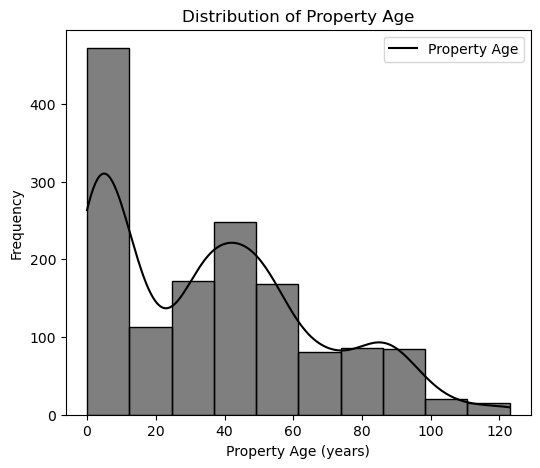

In [52]:
plt.figure(figsize=(6, 5))
ax = sns.histplot(df2['PropertyAge'], bins=10, kde=True, color='black')
plt.title('Distribution of Property Age')
plt.xlabel('Property Age (years)')
plt.ylabel('Frequency')
ax.legend(['Property Age'])
plt.show()

# Insights 

Dominance of Newer Properties: The majority of properties are relatively new, with a significant number clustered between 0 to 20 years. This suggests that the market leans heavily toward newer constructions, likely driven by demand for modern amenities and designs.

Decline in Older Properties: As property age increases, the frequency of properties significantly declines. This could indicate limited supply or market preference against older homes.

Historical Peaks: There are subtle peaks around the 40-year and 60-year marks. These could represent periods of robust construction activity, possibly due to historical economic growth or urbanization trends.

Scarcity of Very Old Properties: Properties older than 80 years are quite rare, implying either demolition and redevelopment of older structures or limited demand for such homes.

Preference for Modern Living: The focus on newer properties highlights a trend where buyers prioritize modern features, safety standards, and energy efficiency. Developers can capitalize on this by promoting innovative and sustainable designs.

Renovation and Redevelopment Opportunities: Properties in the 40- to 60-year range may present redevelopment or renovation opportunities to align them with modern standards, appealing to a broader buyer base.

Aging Property Challenges: The declining frequency with age could reflect maintenance costs or structural concerns associated with older properties. This trend may influence buyer preferences and pricing strategies.

Skewness: The data is right-skewed (positive skewness), meaning that the distribution has a long tail extending towards older ages. This suggests that while most houses are relatively new, there is a minority of much older houses contributing to the overall distribution.

### Distribution of Total Total Area

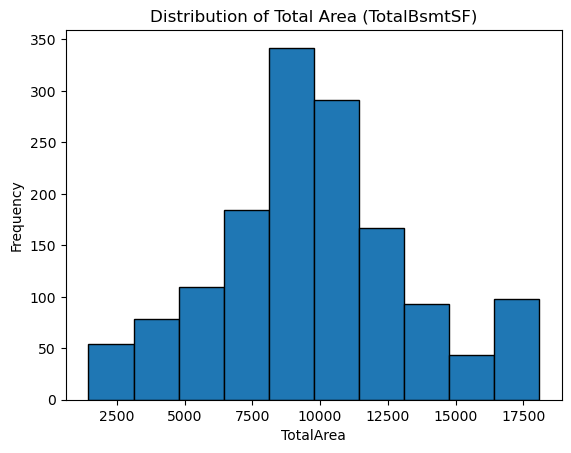

In [53]:
plt.hist(df2['TotalArea'], bins=10, edgecolor='black')
plt.title('Distribution of Total Area (TotalBsmtSF)')
plt.xlabel('TotalArea')
plt.ylabel('Frequency')
plt.show()

# Insights

Popularity of Mid-Sized Basements: The most frequent basement area is around 10,000 square feet, with the highest density at approximately 350 properties. This suggests a strong market preference or standard for mid-sized basements.

Balanced Distribution: The histogram exhibits a roughly normal distribution, peaking around 10,000 square feet and tapering off toward smaller (2,500–5,000 sq. ft.) and larger (15,000–17,500 sq. ft.) basements. This reflects a balanced market with fewer extreme-sized basements.

Moderate Size Range: The majority of properties have a basement size between 7,500 and 12,500 square feet, further reinforcing the preference for moderate-sized basements.

Limited Availability of Extremes: Basements smaller than 5,000 square feet and larger than 15,000 square feet are rare, indicating a niche market for compact or expansive basement spaces.

Demand for Versatility: The dominance of mid-sized basements suggests demand for versatile spaces that can serve multiple purposes, such as storage, recreation, or home offices. Developers may focus on designing customizable basements to meet these needs.

Potential for Renovation: Properties with basements near the lower range of the common size (7,500 sq. ft.) may present opportunities for expansion or upgrades, allowing sellers to target higher-value markets.

Standardized Market Preferences: The clustering around 10,000 square feet reflects a market norm or builder standard. This trend could guide future construction practices to cater to majority buyer preferences.

Sustainability and Cost Efficiency: The decline in frequency at larger basement sizes suggests cost-efficiency and environmental sustainability may influence buyer preferences for moderately-sized basements.

### Distribution of Properties by Neighborhood

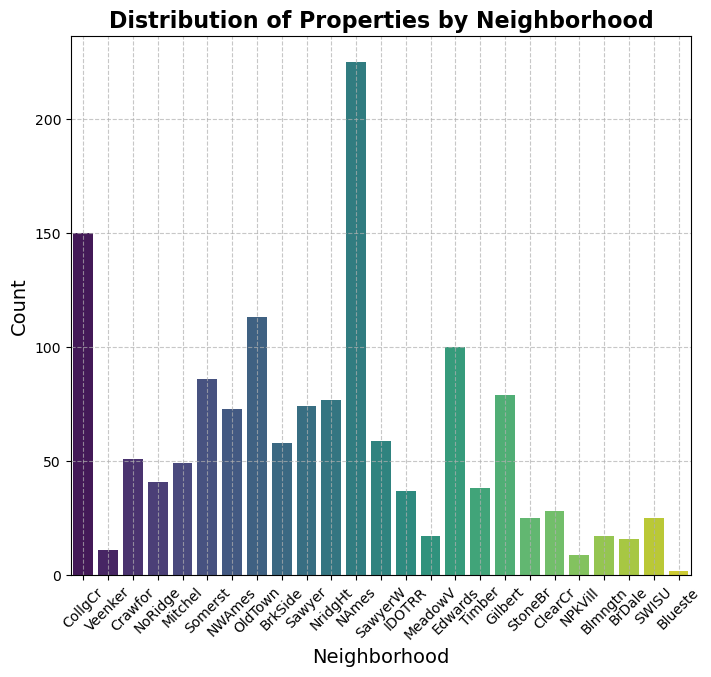

In [54]:
plt.figure(figsize=(8, 7))
sns.countplot(x='Neighborhood', data=df2, palette='viridis')
plt.title('Distribution of Properties by Neighborhood', fontsize=16, fontweight='bold')
plt.xlabel('Neighborhood', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(rotation=45)
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

# Insights 

Names Dominates the Market: The neighborhood NAmes has the highest count of properties, exceeding 200. This indicates it is a significant area for property development or demand.

CollgCr as a Key Player: CollgCr also has a high concentration of properties (around 150), making it another major hub within the market.

Moderate Representation: Neighborhoods such as Veenker, Crawfor, NoRidge, Mitchel, Somerst, NWAmes, OldTown, BrkSide, Sawyerr, and NridgHt have moderate property counts (50–100). These areas may offer a balanced mix of residential options.

Smaller Property Markets: Neighborhoods like MeadowV, Edwards, Timber, Gilbert, StoneBr, ClearCr, NPkVill, Blmngtn, BrDale, SWISU, and Blueste show fewer than 50 properties each, indicating either smaller geographical areas or less-developed regions.

High Demand in NAmes and CollgCr: The dominance of these neighborhoods might reflect high buyer demand, affordability, or desirable living conditions. Developers might focus on these areas to meet ongoing demand.

Diverse Market Sizes: The variation in property counts hints at a diverse market where neighborhoods serve different buyer demographics and preferences—NAmes and CollgCr cater to large demand, while smaller neighborhoods may appeal to niche buyers.

Affordability Considerations: Areas with high property counts may align with affordability trends, suggesting demand for competitively priced homes.

Growth Potential in Smaller Neighborhoods: Neighborhoods with lower property counts could represent opportunities for new developments or revitalization projects to attract buyers.

Neighborhood Popularity Drivers The prominence of NAmes and CollgCr could reflect factors such as proximity to essential services, good school districts, or accessible transportation links. Understanding why these neighborhoods attract the most properties can offer clues for targeted development.

The high number of properties in NAmes and CollgCr might indicate market saturation. This could result in stiff competition among sellers or developers, potentially leading to slower price growth compared to less saturated areas.






### Distribution of BasementCars

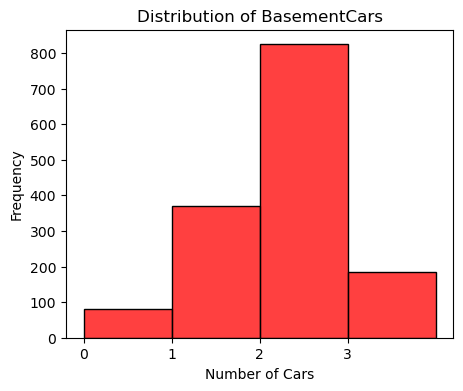

In [55]:
plt.figure(figsize=(5, 4))
sns.histplot(df2['BasementCars'], bins=range(df2['BasementCars'].min(), df2['BasementCars'].max() + 2), kde=False, color='red')
plt.title('Distribution of BasementCars')
plt.xlabel('Number of Cars')
plt.ylabel('Frequency')
plt.xticks(range(df2['BasementCars'].min(), df2['BasementCars'].max() + 1))
plt.show()

# Insights 

Dominance of 2-Car Basements: The highest frequency of properties (800) accommodates 2 cars in the basement, showing that this is the most common configuration.

1-Car Option as a Close Second: Approximately 400 properties are designed to fit 1 car, indicating that this is the second most popular choice.

Limited 3-Car Basements: Around 300 properties cater to 3-car storage, which suggests a smaller but notable demand for larger storage spaces.

Minimal No-Car Basements: Only 100 properties have no car storage in basements, highlighting that most properties prioritize some form of car storage.

Preference for 2-Car Homes: Developers are likely focusing on designing homes with 2-car basements, as this appeals to the largest segment of buyers, likely families with multiple vehicles.

Growing Interest in Larger Basements: The demand for 3-car basements, while smaller, reflects a trend in premium homes or larger families requiring more parking capacity.

Urban Compactness and Single-Car Options: The substantial share of 1-car basements may align with urban or compact housing designs where space is more constrained.

Minimal Demand for No-Car Basements: The low count of properties with no car storage indicates that having basement parking is almost a standard feature in this market.

The notable share of 3-car basements suggests a gradual evolution in buyer preferences toward accommodating larger vehicles or multiple-car ownership. This could reflect rising affluence or the trend of larger families with diverse transportation needs.

The significant share of 1-car basements and the minimal count of no-car basements highlight the impact of urbanization. This trend indicates that even in space-constrained urban developments, a single parking space is often prioritized as an essential amenity.



### Density Plot of BsmntSqFtage

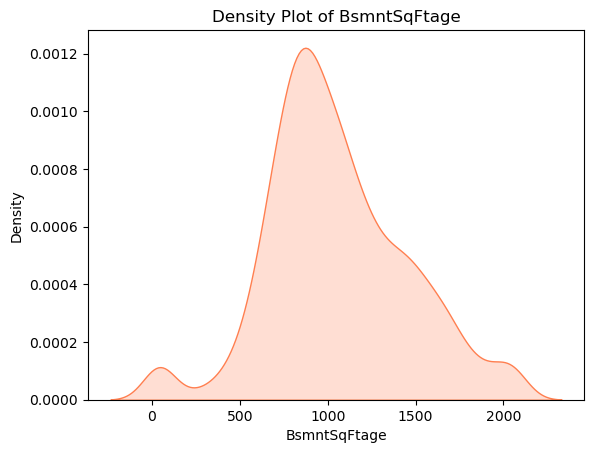

In [56]:
sns.kdeplot(df2['BsmntSqFtage'], shade=True, color='coral')
plt.title('Density Plot of BsmntSqFtage')
plt.xlabel('BsmntSqFtage')
plt.ylabel('Density')
plt.show()

# Insights

The most frequent basement size clusters around 1000 square feet. This suggests that mid-sized basements are the market standard, likely catering to typical family needs for storage or additional living space.

A smaller peak at 0 square feet indicates that some properties do not have basements. These homes might cater to budget-conscious buyers or be situated in areas where basements are not a common feature due to environmental factors.

The density sharply decreases as basement size exceeds 2000 square feet, showing that large basements are uncommon and cater to a niche segment of buyers seeking luxury or expansive homes.

The density curve's smooth tapering suggests a balanced distribution of basement sizes, with moderate representation across different size ranges.

The dominance of 1000-square-foot basements aligns with a broad consumer base seeking practical yet moderately spacious basements. Developers might prioritize offering this size in new construction projects.

The rarity of basements exceeding 2000 square feet points to a niche market. These homes may appeal to luxury buyers looking for additional space for recreation, home theaters, or extensive storage.

The smaller peak at 0 square feet suggests there is still a segment of the market interested in no-basement properties. These could appeal to buyers prioritizing affordability, or in regions where basements are less practical due to soil or climatic conditions.

The distribution of basement sizes might reflect regional factors, such as urban versus suburban housing trends, climate, or zoning regulations that influence the feasibility or desirability of basements.

Homes with smaller basements may present opportunities for expansion or enhancement, catering to buyers seeking additional usable space without the premium cost of a new larger property.

With evolving homebuyer preferences for multifunctional spaces, basements could see innovative uses like home offices, gyms, or entertainment spaces. Developers and renovators could capitalize on these trends by designing basements with flexibility in mind.



### Frequency Distribution of BldgType

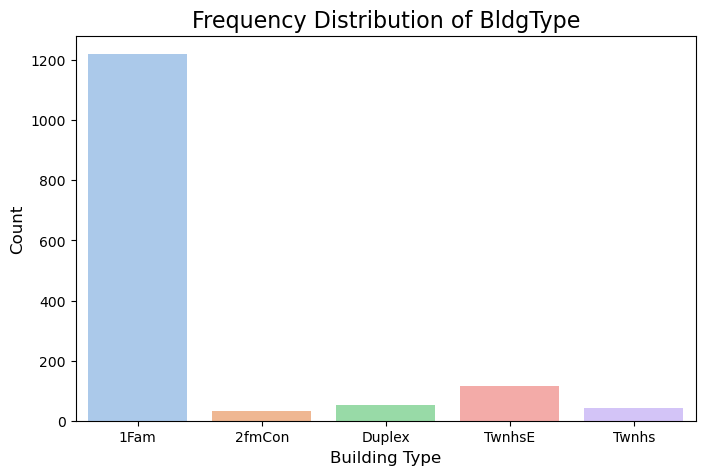

In [57]:
plt.figure(figsize=(8, 5))
sns.countplot(data=df2, x='BldgType', palette='pastel')
plt.title('Frequency Distribution of BldgType', fontsize=16)
plt.xlabel('Building Type', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.show()

# Insights

Dominance of Single-Family Homes: The 1fam  building type is overwhelmingly the most common, accounting for the majority of properties. This indicates a strong preference or demand for single-family homes in the market.

Limited Diversity in Building Types: Other building types like 2fmCon (two-family conversions), Duplex, TwnhsE (end-unit townhouses), and Twnhs (townhouses) have significantly lower counts. This could suggest niche markets or less popularity for multi-family and townhome configurations in the dataset's region.

Potential Target for Investment: Developers or investors looking to tap into the market might focus on single-family homes due to their popularity. Alternatively, the scarcity of multi-family units could represent an opportunity to cater to under-served housing needs.

Urban vs. Suburban Preferences: The dominance of single-family homes may indicate a suburban or rural market where such housing is prevalent and preferred by families.

Affordability Considerations: If the 1fam properties are priced within reach for most buyers, it might further explain their high frequency. Conversely, Duplex and townhomes might appeal to those seeking lower-cost alternatives, but their low counts suggest limited availability or market interest.

Shift in Housing Demand: If recent years show a decline in smaller, multi-family options, the chart reflects a traditional market. This could change with urbanization trends or preferences for affordable housing solutions.



### Frequency Distribution of Amenities

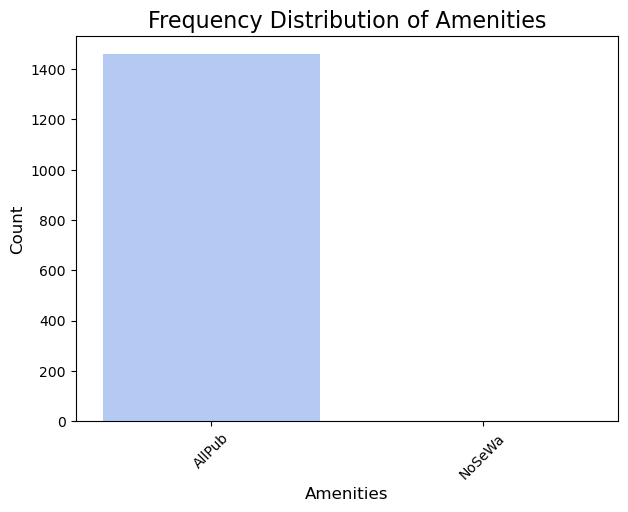

In [58]:
plt.figure(figsize=(7, 5))
sns.countplot(data=df2, x='Amenities', palette='coolwarm') 
plt.title('Frequency Distribution of Amenities', fontsize=16)
plt.xlabel('Amenities', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=45, fontsize=10)  
plt.yticks(fontsize=10)
plt.show()

# Insights

Overwhelming Popularity of "AllPub" The majority of properties in the dataset have AllPub (access to all public utilities), which indicates that such amenities are a standard expectation in this market.

Scarcity of "NoSewWa": The lack of properties with NoSewWa (no sewer or water facilities) highlights that properties without such basic amenities are rare or undesirable in this area.

Preference for Comprehensive Utilities: Buyers or renters prioritize properties with access to public utilities like water, electricity, and sewerage. This reflects the growing demand for convenience and modern infrastructure.

Investment Opportunity in Utility-Ready Properties: Developers and investors may see higher returns by focusing on properties with  AllPub amenities, as they align with market preferences.

Potential Growth in Underserved Areas: If there are regions where such utilities are not widespread, expanding public infrastructure could unlock new housing opportunities and drive property demand.

### Plot the scatter each Each numeric Features

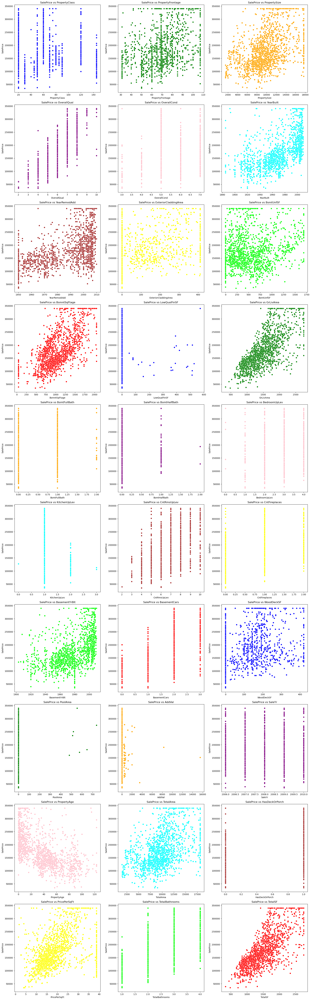

In [59]:
numerical_cols = df2.select_dtypes(include=['number']).columns.drop('SalePrice').tolist()
colors = ['red', 'blue', 'green', 'orange', 'purple', 'pink', 'cyan', 'brown', 'yellow', 'lime'] 
plt.figure(figsize=(20, 70))
for i, col in enumerate(numerical_cols, 1):
    plt.subplot(len(numerical_cols) // 3 + 1, 3, i)
    sns.scatterplot(x=df2[col], y=df2['SalePrice'], color=colors[i % len(colors)])  
    plt.title(f'SalePrice vs {col}')
    plt.xlabel(col)
    plt.ylabel('SalePrice')
plt.tight_layout()
plt.show()

# Bivariate analysis

Bivariate analysis in Python involves examining the relationship between two variables. It helps to understand how one variable affects or is related to another. This type of analysis is crucial in identifying patterns, correlations, and dependencies within a dataset. Common methods for bivariate analysis in Python include scatter plots, correlation matrices, and various statistical tests depending on the data types of the variables being compared. 

### Increase in price over the years

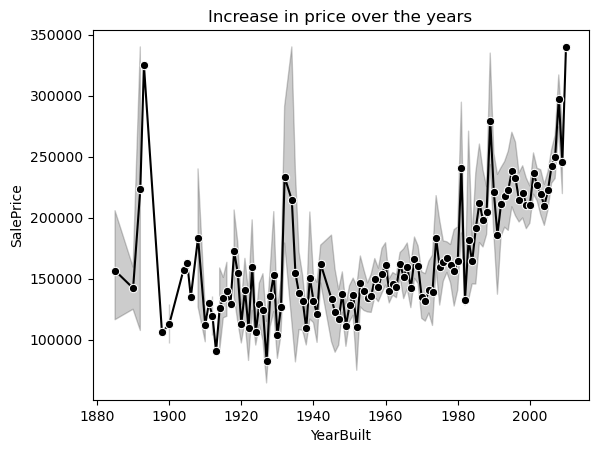

In [60]:
sns.lineplot(x='YearBuilt',y='SalePrice',data=df2,marker='o',color='Black')
plt.title('Increase in price over the years')
plt.show()

# Insights

Variability in Early Years: Properties built between 1880 and 1940 show significant fluctuations in sale prices, indicating inconsistent market demand or valuation during that period.

Stability Mid-Century: From 1940 to 1980, sale prices exhibit a more stable trend with reduced variability, suggesting a period of steady market conditions.

Upward Trend Post-1980: After 1980, there is a clear upward trajectory in sale prices, reflecting increasing property values over time.

Peak Sale Prices: The highest sale prices are observed for properties built around 1900 and after 2000, highlighting periods of heightened market value.

Modern Properties Command Higher Prices: The graph suggests that newer properties tend to have higher sale prices compared to older ones, possibly due to better amenities, construction quality, and location advantages.

properties built around 1900 might hold historical or architectural significance, contributing to their higher sale prices.

Economic Growth Impact: The upward trend in sale prices post-1980 could be linked to economic growth, urbanization, and increased demand for housing.

Investment Opportunities: This trend suggests that investing in property could be profitable, especially in the long term.

Property Market: Property values have been increasing over time, especially in recent years.


### SalePrice vs. GrLivArea

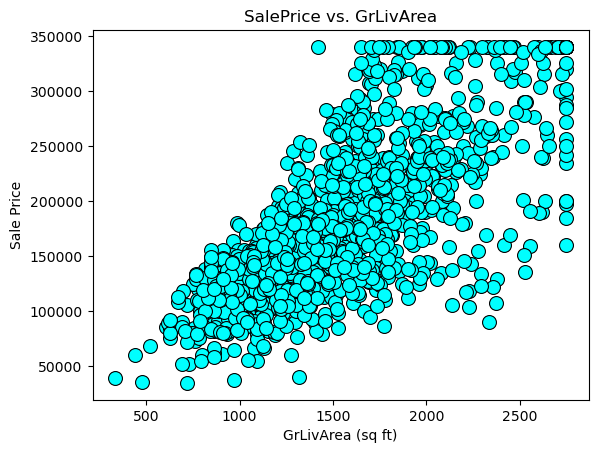

In [61]:
sns.scatterplot(x='GrLivArea', y='SalePrice', data=df2, color='cyan', edgecolor='black', s=100)  
plt.title('SalePrice vs. GrLivArea')
plt.xlabel('GrLivArea (sq ft)')
plt.ylabel('Sale Price')
plt.show()

# Insights

Positive Correlation: Larger homes tend to have higher sale prices. This positive correlation indicates that buyers value increased living space.

Market Preferences: Most properties are concentrated between 1000–2500 sq ft and 100,000–300,000, suggesting these sizes and price ranges cater to the majority of buyers.

Outliers: A few data points show exceptionally high prices or large sizes, which likely represent premium or luxury properties.

Potential for Value Addition: Properties with larger living areas might have higher potential for market appreciation due to demand.

Data Density: Most of the data points are concentrated between 1000 to 2000 square feet for GrLivArea and between ₹100,000 to ₹250,000 for Sale Price. This suggests that the majority of houses in this dataset fall within these size and price ranges.

Luxury Market Segment: Outlier points highlight the growing influence of the high-end market, with unique features driving up values.

Mid-Range Dominance: The concentration of mid-sized properties indicates their stable demand, making them key to market strategy.


### SalePrice vs. OverallQual

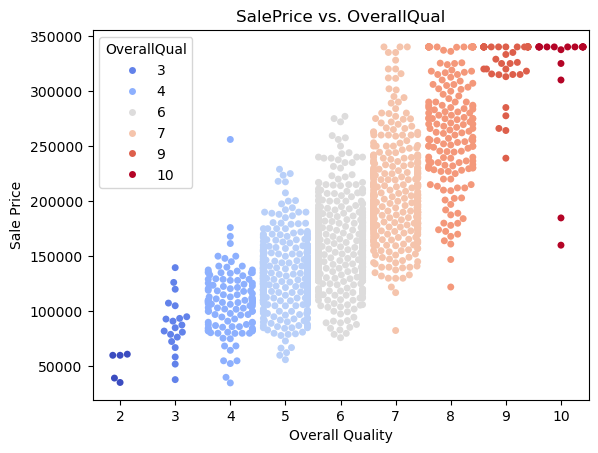

In [62]:
sns.swarmplot(x='OverallQual', y='SalePrice', hue='OverallQual', data=df2, palette='coolwarm')
plt.title('SalePrice vs. OverallQual')
plt.xlabel('Overall Quality')
plt.ylabel('Sale Price')
plt.show()

# insights

Strong Positive Correlation: The data shows that higher-quality houses are generally sold for higher prices. Properties with an overall quality of 10 command the highest prices, often exceeding 300,000.

Lower-End Segment: Houses rated 3 or 4 in overall quality mostly sell below 150,000, suggesting limited demand for low-quality properties.

Price Variability for Higher Quality: Sale prices for houses with higher quality (6 and above) show greater variability, indicating factors like location, amenities, or lot size influencing value.

Investment Potential: Enhancing a house's overall quality could significantly increase its market appeal and resale price.

Premium Properties Leading Growth: High-quality houses dominate the premium segment of the market, reflecting growing demand for well-built, high-end homes.

Limited Appeal of Lower Quality Homes: Buyers may steer away from low-quality properties unless priced aggressively, impacting the affordable segment.

Renovation and Value Addition: Many homeowners invest in upgrades to boost overall quality ratings, aligning with market trends emphasizing quality.

Regional Influence: Price trends might vary by location, with urban or well-connected areas showing higher premiums for high-quality housing.

he presence of high-value homes with quality ratings of 9 and 10 highlights a strong luxury market segment. These homes cater to buyers seeking premium features and are willing to pay a higher price for superior quality.



### SalePrice vs. PropertyStyle

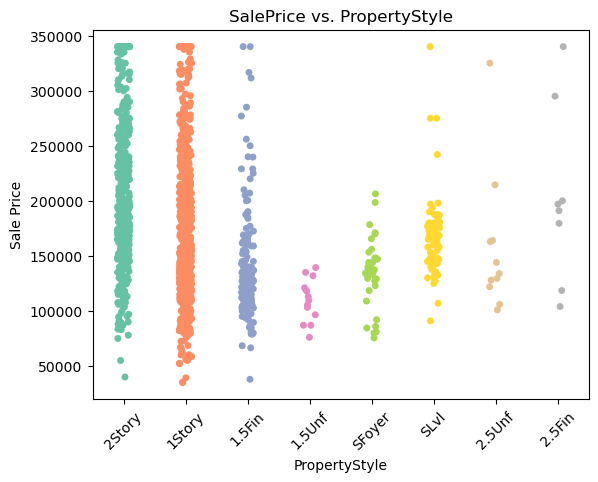

In [63]:
sns.stripplot(data=df2, x='PropertyStyle', y='SalePrice', palette='Set2', jitter=True)
plt.title('SalePrice vs. PropertyStyle')
plt.xlabel('PropertyStyle')
plt.ylabel('Sale Price')
plt.xticks(rotation=45)  
plt.show()

# Insights

Popularity of 2Story and 1Story Homes: These property styles dominate the data and show a wide range of sale prices (approximately ₹1,00,000 to ₹3,00,000). This suggests their popularity and versatility in the housing market.

Price and Style Trends

1.5Fin and 1.5Unf Properties: These have fewer data points and tend to have lower sale prices, usually under ₹1,50,000. They may cater to budget buyers or niche markets.

SFoyer and SLvl Styles: These are moderately priced, mostly within the range of ₹50,000 to ₹2,00,000, and may appeal to mid-segment buyers.

High-End Properties: 2.5Fin styles represent premium homes, with prices often exceeding ₹2,00,000. These might offer luxury features or be in prime locations.
Demand for Versatility: The strong representation of 2Story and 1Story homes suggests they meet a variety of buyer preferences, making them key players in the housing market.

Demand for Versatility: The strong representation of 2Story and 1Story homes suggests they meet a variety of buyer preferences, making them key players in the housing market.

Rising Luxury Market: Limited data points for 2.5Fin homes imply a niche but growing market for premium properties.




### PropertyAge vs SalePrice

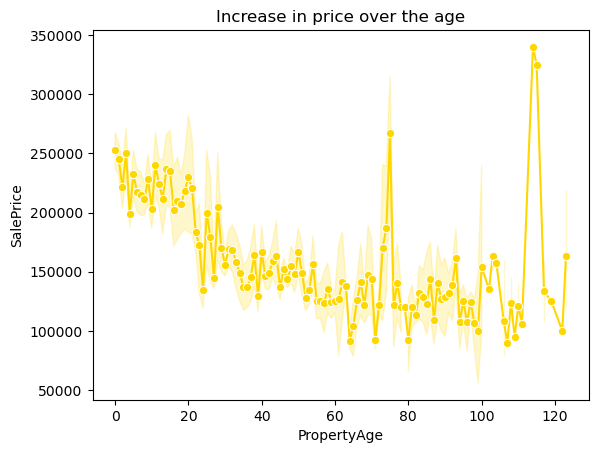

In [64]:
sns.lineplot(x='PropertyAge',y='SalePrice',data=df2,marker='o',color='gold')
plt.title('Increase in price over the age')
plt.show()

# Insights 

Properties aged between 0–20 years consistently show higher sale prices, usually ranging between ₹200,000–₹250,000. This indicates buyers often favor newer homes for modern amenities and better condition.

As properties age beyond 20 years, their sale prices tend to decrease, stabilizing between ₹100,000–₹150,000 for homes aged 60–100 years. This highlights depreciation or lesser market appeal.

Interesting spikes in sale prices are observed for properties aged approximately 80 years and 120 years, with values soaring up to ₹300,000–₹350,000. These could reflect historical significance or prime renovation potential.

Modern properties (built in the last 20 years) are in high demand, driven by urbanization and interest in contemporary designs and facilities.

Older properties—especially those aged around 80 or 120 years—may attract buyers looking to invest in renovation projects for higher resale or rental value.

Properties aged 60–100 years exhibit stable pricing trends, indicating a reliable market for mid-century homes with durable construction or specific charm.

Historical or unique properties aged above 100 years often cater to niche buyers seeking character or exclusivity, highlighting opportunities in specialized housing segments.


### PropertyZone vs. SalePrice

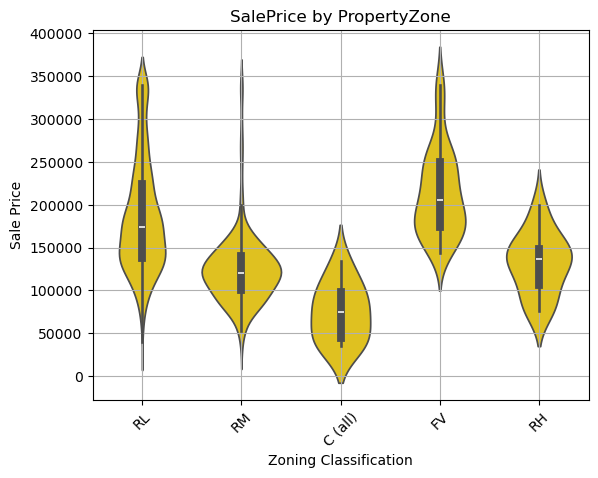

In [65]:
sns.violinplot(data=df2, x='PropertyZone', y='SalePrice',color='gold')
plt.title('SalePrice by PropertyZone')
plt.xlabel('Zoning Classification')
plt.ylabel('Sale Price')
plt.xticks(rotation=45)
plt.grid(True) 
plt.show()

# Insights 

High-Value Zones: Properties in the FV zoning classification tend to have the highest sale prices, with a median around 200,000. RL zones also show relatively high sale prices, with a similar median.

Affordable Zones: The C (all) zoning classification has the lowest median sale price, around 100,000, and a narrower distribution, making it a more affordable option.

Wider Price Range: The RM zoning classification exhibits a broader range of sale prices, but its median sale price is lower, around 150,000.

Moderate Pricing: RH zones have a median sale price similar to RM, around 150,000, with a comparable distribution.

FV has the highest median sale price, followed by RL.

C (Commercial) has the lowest median sale price, indicating that properties in this zone are generally less expensive.

Premium Residential Zones:

FV appears to be a high-demand zone with premium pricing, likely due to desirable location or amenities.

RL also attracts higher-end buyers, as indicated by its broad price range and high-value outliers.

Affordable Zones:

RM and C zones cater to buyers looking for more affordable options with less variability in pricing.

Zoning Impact on Property Value:

Zoning classification significantly influences property value, with residential zones like FV and RL commanding higher prices compared to commercial or high-density residential zones.

### SalePrice by BasementType'

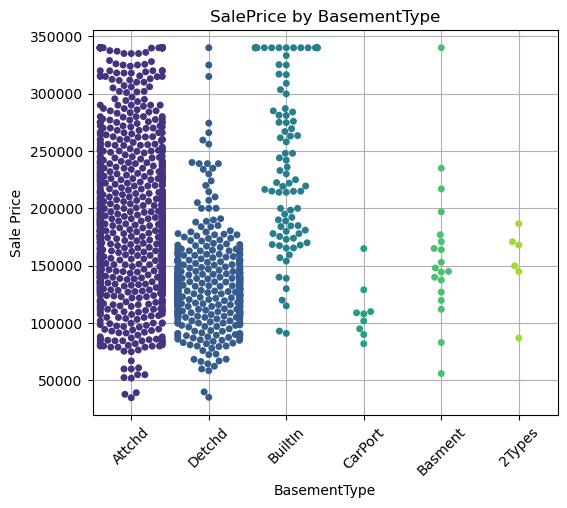

In [66]:
plt.figure(figsize=(6, 5))
sns.swarmplot(data=df2, x='BasementType', y='SalePrice', palette='viridis')
plt.title('SalePrice by BasementType')
plt.xlabel('BasementType')
plt.ylabel('Sale Price')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

# Insights 

Attached Basements (Attchd): These homes generally command higher sale prices, with many clustered between 150,000 and 300,000. This suggests a strong preference for attached basements among buyers.

Detached Basements (Detachd): These tend to have lower sale prices, mostly ranging between 100,000 and 200,000, indicating they might be less desirable or offer fewer amenities.

Built-In Basements (BuiltIn): These show a wide range of sale prices, with many data points between 150,000 and 300,000, suggesting versatility in their appeal.

Carports (CarPort): Homes with carports have fewer data points and generally lower sale prices, mostly below 150,000, indicating limited demand.

Basements (Basment): Sale prices are scattered, with some reaching up to 300,000, showing variability in buyer preferences.

Two Types of Basements (2Types): These have fewer data points but show a wide range of sale prices, with some reaching up to 300,000, suggesting niche appeal.

### SalePrice vs. PricePerSqFt

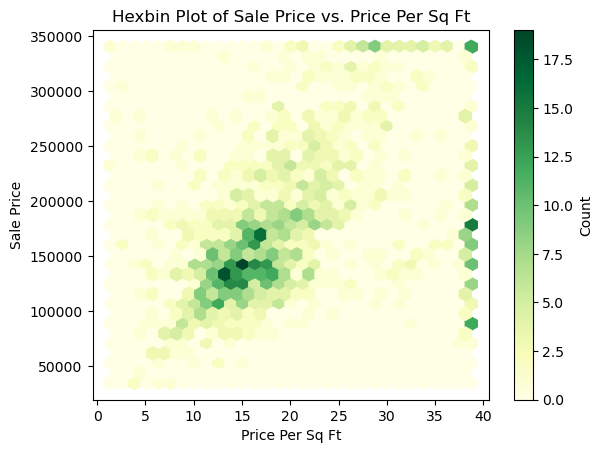

In [67]:
plt.hexbin(df2['PricePerSqFt'], df2['SalePrice'], gridsize=30, cmap='YlGn')
plt.colorbar(label='Count')
plt.xlabel('Price Per Sq Ft')
plt.ylabel('Sale Price')
plt.title('Hexbin Plot of Sale Price vs. Price Per Sq Ft')
plt.show()

# Insights 

Concentration of Properties: Most properties are clustered around a price per square foot of 10 to 25 and a sale price of 100,000 to 200,000. This suggests that these ranges are the most common in the market.

Positive Correlation: There is a clear trend where higher sale prices are associated with higher prices per square foot, indicating a positive correlation between these two variables.

Market Sweet Spot: The densest cluster of data points lies between a price per square foot of 15 to 20 and a sale price of 150,000 to 200,000. This could represent the "sweet spot" for buyers and sellers in the market.

Market Sweet Spot: The densest cluster of data points lies between a price per square foot of 15 to 20 and a sale price of 150,000 to 200,000. This could represent the "sweet spot" for buyers and sellers in the market.

he darker hexagons show areas with higher transaction counts, suggesting that these price ranges are more popular or accessible to buyers.

The concentration around mid-range prices suggests strong demand for affordable housing options in the market.

The presence of outliers at higher price points indicates an active but smaller luxury market segment.

Buyers appear to favor properties with moderate price per square foot, highlighting sensitivity to cost efficiency in terms of space utilization.



### Street vs SalePrice

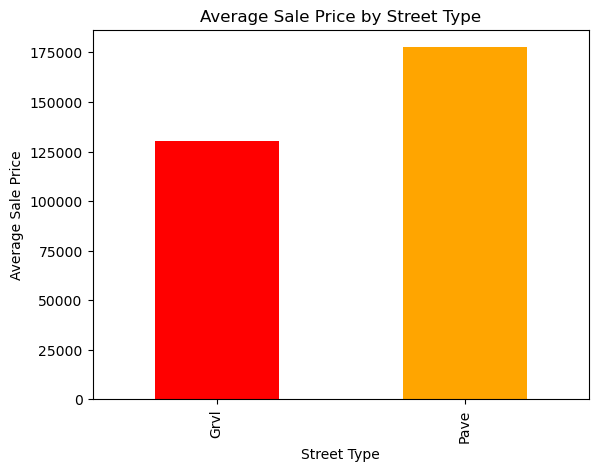

In [68]:
average_prices = df2.groupby('Street')['SalePrice'].mean()
average_prices.plot(kind='bar', color=['red', 'orange'])
plt.xlabel('Street Type')
plt.ylabel('Average Sale Price')
plt.title('Average Sale Price by Street Type')
plt.show()

# Insights 

Paved Streets Command Higher Prices: Properties on paved streets have an average sale price of approximately 175,000, significantly higher than the 125,000 average for gravel streets. This suggests a strong buyer preference for paved streets, likely due to better infrastructure and accessibility.

Market Implications

For Buyers: Investing in properties on paved streets might offer better long-term value.

For Developers: Prioritizing developments in areas with paved streets could maximize returns.

For Urban Planners: The trend underscores the importance of improving street infrastructure to boost property values.

Increased demand for properties on paved streets could lead to higher prices in such areas.

Gravel street properties might see slower appreciation unless infrastructure improvements are made.



### Condition vs SalePrice

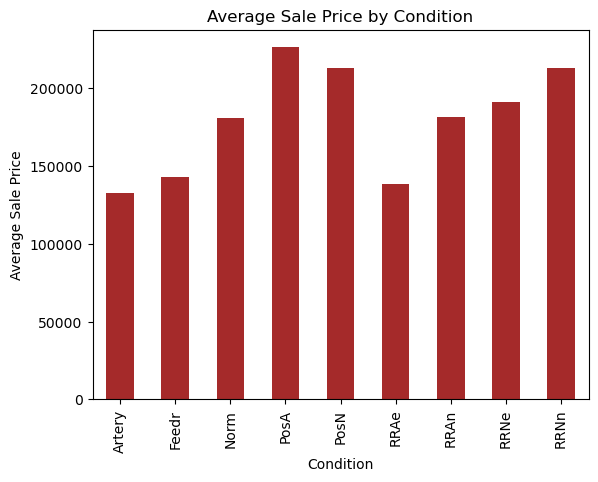

In [69]:
average_condition_prices = df2.groupby('Condition')['SalePrice'].mean()
average_condition_prices.plot(kind='bar', color='brown')
plt.xlabel('Condition')
plt.ylabel('Average Sale Price')
plt.title('Average Sale Price by Condition')
plt.show()

# Insights 

Properties in the "PosA" condition have the highest average sale price, exceeding 225,000. This indicates they are the most desirable or premium.

Properties in the "PosN" condition also command high prices, slightly lower than "PosA."

"Norm," "RRNe," and "RRNn" properties are in the moderate price range, between 175,000 and 200,000.

"Artery," "Feedr," "RRAe," and "RRAn" properties show lower average prices, likely less in demand.

High Demand for Premium Conditions: Properties with "PosA" and "PosN" conditions might see increased demand due to their premium nature.

Moderate Growth Opportunities: Conditions like "Norm," "RRNe," and "RRNn" might represent stable investments with moderate returns.

Infrastructure Impact: Lower-priced properties in conditions such as "Artery" and "Feedr" could benefit from improvements in amenities or infrastructure to boost desirability and value.

Improvement Projects: Initiatives to improve conditions in areas like Feedr and RRAe could result in rising property values. Noise reduction measures, better infrastructure, and enhanced green spaces can make these areas more attractive.



### SaleYr Trends Over Time

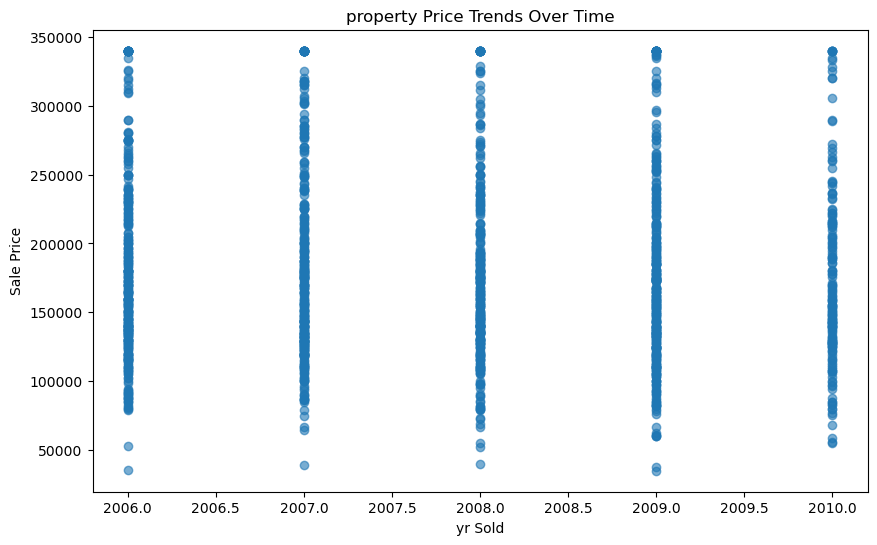

In [70]:
plt.figure(figsize=(10, 6))
plt.scatter(df2['SaleYr'], df2['SalePrice'], alpha=0.6,marker='o',)
plt.title('property Price Trends Over Time')
plt.xlabel('yr Sold')
plt.ylabel('Sale Price')
plt.show()

# Insights

Stable Market Prices: From 2006 to 2010, property prices remained relatively stable, with no clear upward or downward trends. This suggests a consistent demand-supply balance during this period.

Diverse Price Range: Properties sold ranged from below 50,000 to above 300,000, indicating a wide variety in property types and values.

Price Concentration: The majority of sales were concentrated between 100,000 and 300,000, likely representing mid-range properties.

Consistency in Demand: The stable pricing may indicate steady demand across different property price segments during these years.

Premium Properties Holding Value: High-value properties consistently sold above 300,000 each year, showing resilience in the premium market segment.

Opportunities in Affordable Properties: Properties priced below 100,000 could represent opportunities for investment or development, appealing to budget-conscious buyers.

Each year shows a dense cluster of transactions, indicating a steady market activity.



### Price Per Square Foot Trends Over Time

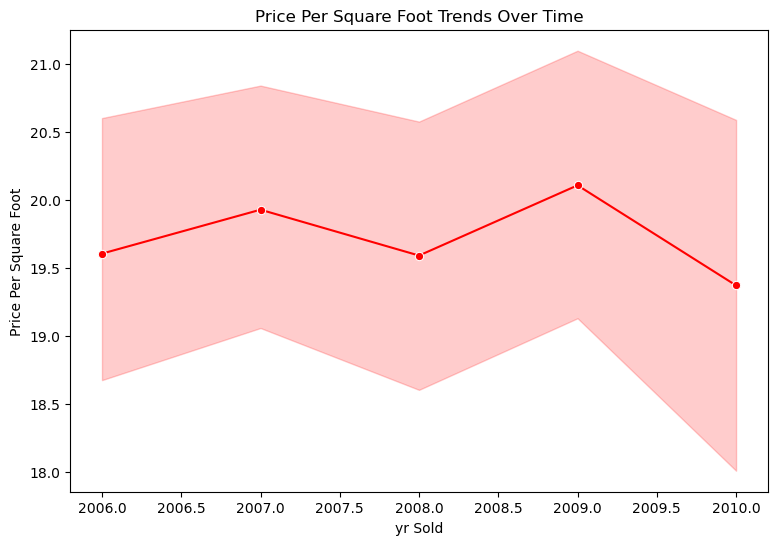

In [71]:
plt.figure(figsize=(9, 6))
sns.lineplot(x='SaleYr', y='PricePerSqFt', data=df2, marker='o', color='red')
plt.title('Price Per Square Foot Trends Over Time')
plt.xlabel('yr Sold')
plt.ylabel('Price Per Square Foot')
plt.show()

# Insights

Fluctuating Prices: The price per square foot fluctuates within a relatively narrow range, between 19.0 and 20.5, from 2006 to 2010. This suggests a steady yet somewhat volatile market during this period.

The highest value is observed in 2007 and 2009, where prices approach 20.0 per square foot.

The lowest point occurs in 2008, dipping slightly below 19.5.

By 2010, there is a minor decline, stabilizing around 19.5 again.

Overall Stability: Despite slight ups and downs, the market shows no drastic changes, reflecting a stable pricing environment over time.

Market Resilience: Prices remain within a stable band, showing that the market likely experienced consistent demand and supply over these years.

Potential Growth Periods: The peaks in 2007 and 2009 could indicate periods of stronger demand or improved economic conditions driving prices higher.

Opportunities for Value: The dip in 2008 suggests a brief period of potential affordability, possibly linked to external economic factors (e.g., global financial crisis).

Preference for Stability: The overall steadiness in price per square foot indicates a market trend where buyers and sellers favored predictable valuations, avoiding significant volatility.



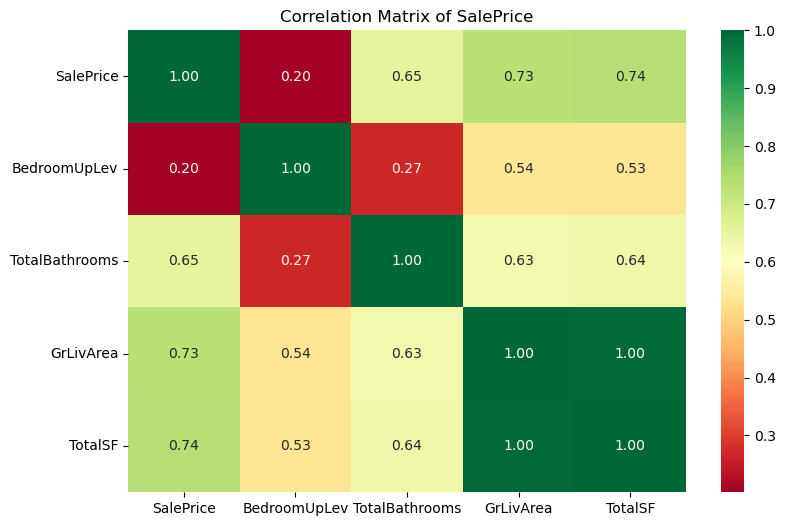

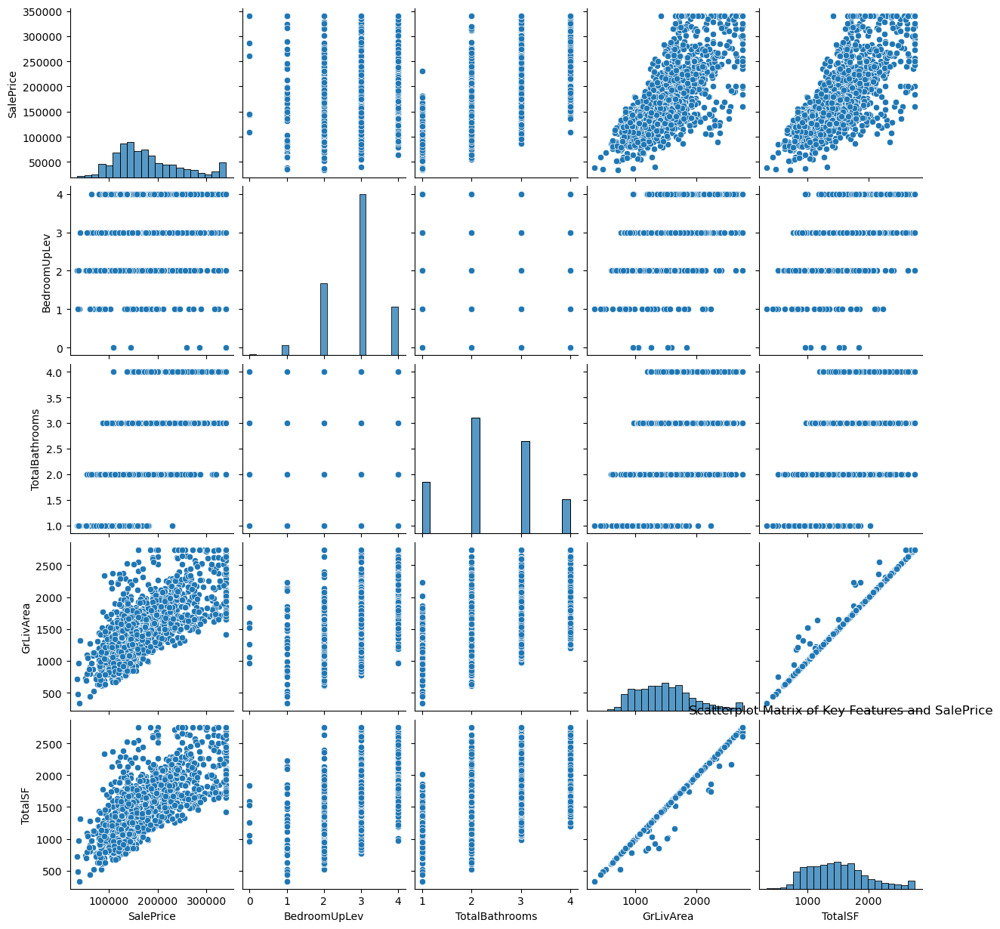

In [72]:
key_features = ['SalePrice', 'BedroomUpLev', 'TotalBathrooms', 'GrLivArea', 'TotalSF']

correlation_matrix = df2[key_features].corr()
plt.figure(figsize=(9, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='RdYlGn', fmt='.2f')
plt.title('Correlation Matrix of SalePrice')
plt.show()
sns.pairplot(df2[key_features])
plt.title('Scatterplot Matrix of Key Features and SalePrice')
plt.show()

# Insights of Heatmap

SalePrice Correlations:

SalePrice has the highest correlation with TotalSF (0.74), followed closely by GrLivArea (0.73), and TotalBathrooms (0.65). This indicates that the total square footage, above-ground living area, and number of bathrooms are strong predictors of sale price.

BedroomUpLev has a weak positive correlation with SalePrice (0.20), suggesting it is not a primary driver of sale price.

High Intercorrelations:

GrLivArea and TotalSF are perfectly correlated (1.00), which is expected as they likely measure similar aspects of the property size. This multicollinearity could be an issue if these variables are used together in a linear regression model.

Moderate Correlations:

TotalBathrooms have a moderate correlation with GrLivArea (0.63) and TotalSF (0.64), which makes sense as larger properties typically have more bathrooms.

BedroomUpLev has correlation of (0.54) and (0.53) with GrLivArea and TotalSF respectively.

Focus on Size and Bathrooms:

In this market, buyers appear to prioritize the overall size of the property (TotalSF and GrLivArea) and the number of bathrooms. Real estate agents and developers should emphasize these features in their marketing and construction efforts.

The relatively low correlation between BedroomUpLev and SalePrice suggests that increasing the number of bedrooms without also increasing the overall size or quality of the property may not significantly increase the sale price

# Insights of Pairplot

SalePrice vs. GrLivArea and TotalSF:

There is a clear positive correlation between the sale price and both the gross living area (GrLivArea) and total square footage (TotalSF). This suggests that larger homes tend to command higher prices.

SalePrice vs. BedroomUpLev and TotalBathrooms:

No strong correlation is observed between the sale price and the number of bedrooms on the upper level or the total number of bathrooms. These features seem to have a limited impact on pricing.

GrLivArea vs. TotalSF:

A strong positive relationship exists between the gross living area and total square footage, indicating that homes with larger living spaces generally have more total area.

Distribution Patterns:

The histograms along the diagonal reveal the distribution of each variable:

SalePrice is right-skewed, meaning most homes are priced lower, with a few high-priced outliers.

BedroomUpLev and TotalBathrooms show discrete distributions, while GrLivArea and TotalSF have more continuous distributions.

Demand for Larger Homes: The positive correlation between sale price and size-related features (GrLivArea and TotalSF) suggests a market preference for larger homes.

Focus on Usable Space: Buyers may prioritize living area and total square footage over the number of bedrooms or bathrooms.

Price Distribution: The skewed distribution of sale prices indicates a market with a majority of affordable homes and a smaller segment of luxury properties.

### Correlation

In [73]:
table = df2.groupby(['Neighborhood'],as_index=False)['SalePrice'].median()
table = table.sort_values(by='SalePrice',ascending=False)
table.style.background_gradient(cmap='Reds')

,Neighborhood,SalePrice
16,NridgHt,315000.000000
15,NoRidge,301500.000000
22,StoneBr,278000.000000
23,Timber,228475.000000
21,Somerst,225500.000000
24,Veenker,218000.000000
6,Crawfor,200624.000000
4,ClearCr,200250.000000
5,CollgCr,197200.000000
0,Blmngtn,191000.000000


In [74]:
corr = df2.select_dtypes(include='number').corr()
corr = corr.style.background_gradient(cmap='YlGnBu')
corr

,PropertyClass,PropertyFrontage,PropertySize,OverallQual,OverallCond,YearBuilt,YearRemodAdd,ExteriorCladdingArea,BsmtUnfSF,BsmntSqFtage,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,BedroomUpLev,KitchenUpLev,CntRmsUpLev,CntFireplaces,BasementYrBlt,BasementCars,WoodDeckSF,PoolArea,AddVal,SaleYr,SalePrice,PropertyAge,TotalArea,HasDeckOrPorch,PricePerSqFt,TotalBathrooms,TotalSF
PropertyClass,1.000000,-0.400974,-0.403400,0.062802,-0.082638,0.055790,0.058578,0.034657,-0.132786,-0.251190,0.044201,0.098237,-0.003826,0.003276,-0.062776,0.260757,0.044963,-0.029120,0.100472,-0.019661,-0.009879,0.012660,-0.011390,-0.021216,-0.061456,-0.056742,-0.398152,0.087397,0.476427,0.202149,0.096419
PropertyFrontage,-0.400974,1.000000,0.580084,0.243913,-0.056608,0.139581,0.077353,0.209752,0.149730,0.336737,0.020515,0.341202,0.062636,-0.007258,0.286378,0.003670,0.337810,0.224121,0.076461,0.311303,0.102447,0.073433,0.003213,0.006429,0.376018,-0.139112,0.579006,0.067868,-0.294509,0.179013,0.342873
PropertySize,-0.403400,0.580084,1.000000,0.221599,-0.022216,0.065767,0.054474,0.144087,0.087060,0.361770,0.017951,0.433871,0.119756,0.042409,0.304171,-0.018589,0.395018,0.351998,0.013237,0.310164,0.198310,0.101143,0.056271,-0.036831,0.435878,-0.067351,0.999289,0.105950,-0.568334,0.243387,0.437263
OverallQual,0.062802,0.243913,0.221599,1.000000,-0.121101,0.575160,0.550829,0.414226,0.301683,0.541432,-0.030650,0.597218,0.113263,-0.040523,0.122008,-0.184702,0.435768,0.396809,0.516129,0.609159,0.246423,0.065313,-0.031597,-0.027299,0.817680,-0.575562,0.231295,0.368042,0.493308,0.546824,0.603273
OverallCond,-0.082638,-0.056608,-0.022216,-0.121101,1.000000,-0.370354,0.034616,-0.140566,-0.147491,-0.179829,0.020675,-0.109536,-0.049131,0.095472,0.009020,-0.097113,-0.079063,-0.032053,-0.317909,-0.202535,-0.012376,0.003140,0.056884,0.039762,-0.092618,0.371421,-0.023690,-0.075867,-0.086480,-0.195478,-0.110906
YearBuilt,0.055790,0.139581,0.065767,0.575160,-0.370354,1.000000,0.594909,0.346081,0.145222,0.410450,-0.183239,0.214644,0.187634,-0.038534,-0.044731,-0.175570,0.106356,0.148330,0.779092,0.546705,0.238377,0.004893,-0.034583,-0.013292,0.570327,-0.999035,0.074752,0.372243,0.467169,0.529968,0.227394
YearRemodAdd,0.058578,0.077353,0.054474,0.550829,0.034616,0.594909,1.000000,0.185138,0.178269,0.301581,-0.062419,0.296849,0.119904,-0.012337,-0.030018,-0.149598,0.196675,0.110941,0.616669,0.425546,0.222702,0.005829,-0.010286,0.035743,0.552061,-0.592523,0.064067,0.374880,0.436483,0.435598,0.303817
ExteriorCladdingArea,0.034657,0.209752,0.144087,0.414226,-0.140566,0.346081,0.185138,1.000000,0.108653,0.355451,-0.080244,0.361094,0.098529,0.030109,0.132021,-0.037689,0.281209,0.251170,0.262757,0.385982,0.161904,-0.000430,-0.032655,0.002687,0.450751,-0.345449,0.149203,0.142187,0.260902,0.327498,0.367244
BsmtUnfSF,-0.132786,0.149730,0.087060,0.301683,-0.147491,0.145222,0.178269,0.108653,1.000000,0.427651,0.029799,0.245849,-0.427686,-0.096124,0.163970,0.029471,0.253432,0.050528,0.181543,0.211099,-0.010010,-0.035367,-0.023693,-0.042777,0.215986,-0.146967,0.087962,0.074486,0.092223,-0.089383,0.244617
BsmntSqFtage,-0.251190,0.336737,0.361770,0.541432,-0.179829,0.410450,0.301581,0.355451,0.427651,1.000000,-0.034404,0.404359,0.304692,0.001173,0.046413,-0.066893,0.271000,0.328147,0.320361,0.461365,0.241778,0.048518,-0.018032,-0.018521,0.645251,-0.410701,0.369185,0.230434,0.197814,0.329588,0.409557


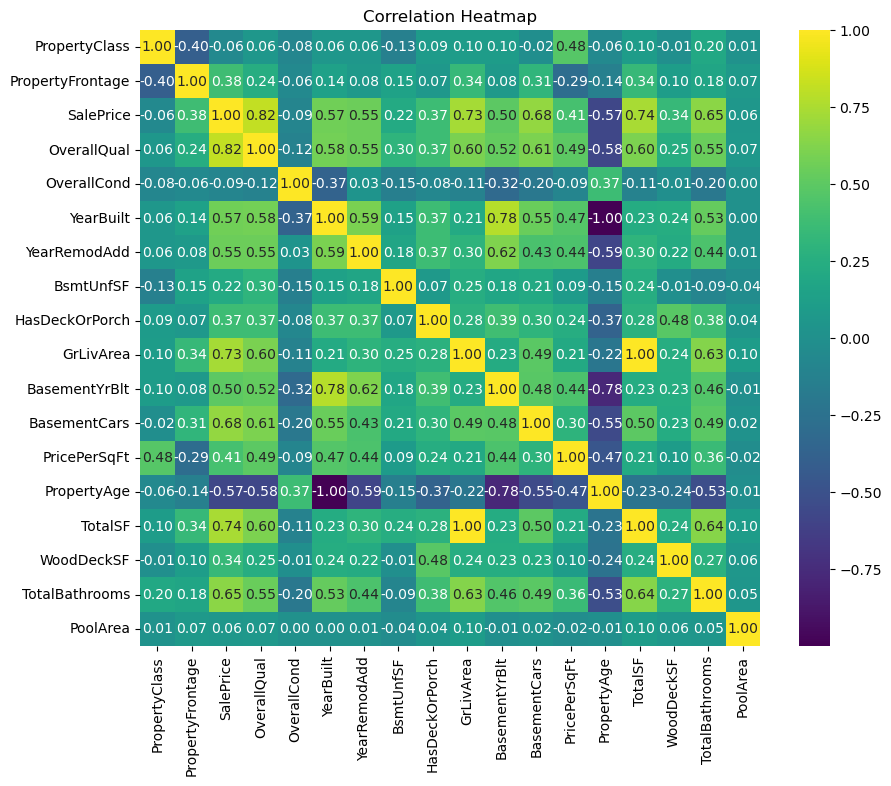

In [75]:
heatmap_data = df2[['PropertyClass', 'PropertyFrontage', 'SalePrice', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'BsmtUnfSF','HasDeckOrPorch','GrLivArea','BasementYrBlt','BasementCars','PricePerSqFt','PropertyAge','TotalSF','WoodDeckSF','TotalBathrooms','PoolArea']]
plt.figure(figsize=(10, 8))
sns.heatmap(heatmap_data.corr(), annot=True, cmap='viridis', fmt='.2f')
plt.title('Correlation Heatmap')
plt.show()

# Insights 

SalePrice Correlations:

Highly Positive Correlations:

OverallQual (0.82): Better property quality is a strong driver for higher sale prices.

GrLivArea (0.73): Larger above-ground living areas significantly influence sale prices.

TotalSF (0.74): Properties with larger total square footage tend to sell for higher prices.

PricePerSqFt (0.74): Higher price per square foot aligns with higher overall property valuation.

Moderate Positive Correlations:

YearBuilt (0.57) and YearRemodAdd (0.55): Newly constructed or recently remodeled properties are more valuable.

WoodDeckSF and HasDeckOrPorch: Properties with outdoor features like decks are moderately attractive to buyers.

Negative Correlations:

PropertyAge (-0.55): Older properties tend to have lower sale prices.

Quality and Features:

OverallQual correlates strongly with other high-value variables such as TotalSF and GrLivArea, indicating the importance of property quality across all metrics.

TotalBathrooms and PoolArea have mild positive correlations, showing that additional amenities add to the desirability of properties.

Living Space and Layout:

GrLivArea and TotalSF are interrelated, suggesting that the overall size and usable living area play critical roles in determining property value.

Buyers are likely attracted to properties that are recently built or remodeled, which offer modern designs and less maintenance.

Wood decks or porches contribute positively to property valuation, emphasizing the importance of outdoor spaces.

Total square footage and above-ground living areas are strong influencers. Properties offering more space tend to dominate the market in terms of sale price.

Older properties depreciate unless remodeled to meet modern standards, signaling the need for upkeep or renovations in older homes to maintain their value.

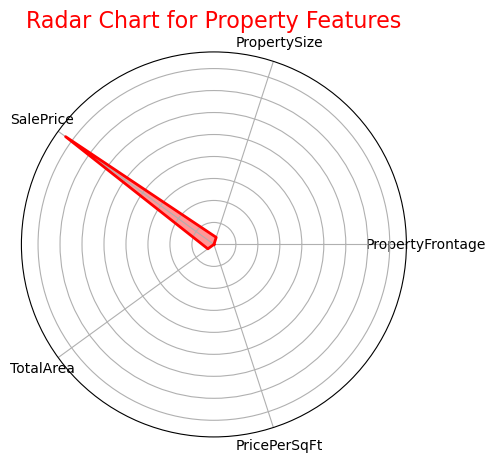

In [76]:
categories = ['PropertyFrontage', 'PropertySize', 'SalePrice', 'TotalArea', 'PricePerSqFt']
values = df2.iloc[0][categories].values.flatten().tolist()
values += values[:1]  
angles = [n / float(len(categories)) * 2 * pi for n in range(len(categories))]
angles += angles[:1]  
custom_color = 'red'
fig, ax = plt.subplots(figsize=(6, 5), subplot_kw=dict(polar=True))
ax.plot(angles, values, linewidth=2, linestyle='solid', color=custom_color)  
ax.fill(angles, values, color=custom_color, alpha=0.4)  
ax.set_yticklabels([]) 
ax.set_xticks(angles[:-1])
ax.set_xticklabels(categories)
plt.title("Radar Chart for Property Features", size=16, color=custom_color)
plt.show()


# Insights

SalePrice Comparison: The SalePrice of the property is the most prominent feature compared to others. This indicates that the market value of the property is high.

PropertySize and PropertyFrontage:

The PropertySize is impressive, but PropertyFrontage is relatively moderate. This insight suggests that while the property is overall large, its width (frontage) is not extensive.

PricePerSqFt:

The PricePerSqFt is low, which suggests that the property is cost-efficient in terms of its size. This could be a positive factor for buyers looking for cost efficiency.

TotalArea:

The TotalArea is in a decent range. This indicates that the property's indoor and outdoor total utilization space is adequate.

Overall Analysis:
The shape of the chart indicates that some features of the property (eg, SalePrice and PropertySize) are very strong, while others (e.g., PropertyFrontage and PricePerSqFt) are relatively weaker.

# Model Building & Evaluation

In [77]:
# This is Final Data 
df2

,PropertyClass,PropertyZone,PropertyFrontage,PropertySize,Street,PropertyShape,Elevation,Amenities,Orientation,Grade,Neighborhood,Condition,BldgType,PropertyStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMaterial,ExteriorCladdingType,ExteriorCladdingArea,ExterCond,PropertyFooting,BsmntFinish,BsmntMaintenance,BsmntFinRat1,BsmtUnfSF,BsmntSqFtage,Heating,HeatingEfficiency,CentralAir,Electrical,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,BedroomUpLev,KitchenUpLev,KitchenQual,CntRmsUpLev,Functional,CntFireplaces,QualFireplace,BasementType,BasementYrBlt,BasementFinish,BasementCars,BasementQual,BasementCond,PavedDrive,WoodDeckSF,PoolArea,AddVal,SaleYr,SalePrice,PropertyAge,TotalArea,HasDeckOrPorch,PricePerSqFt,TotalBathrooms,TotalSF
0,60,RL,65,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,1Fam,2Story,7,5,2003,2003,Gable,VinylSd,BrkFace,196.000,TA,PConc,Gd,TA,GLQ,150,856,GasA,Ex,Y,SBrkr,0,1710,1,0,3,1,Gd,8,Typ,0,Gd,Attchd,2003,RFn,2,TA,TA,Y,0,0,0,2008,208500.0,5,8511,1,24.67000,4,1710
1,20,RL,80,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,1Fam,1Story,6,7,1976,1976,Gable,MetalSd,BrkFace,0.000,TA,CBlock,Gd,TA,ALQ,284,1262,GasA,Ex,Y,SBrkr,0,1262,0,1,3,1,TA,6,Typ,1,TA,Attchd,1976,RFn,2,TA,TA,Y,298,0,0,2007,181500.0,31,9898,1,18.91000,2,1262
2,60,RL,68,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,1Fam,2Story,7,5,2001,2002,Gable,VinylSd,BrkFace,162.000,TA,PConc,Gd,TA,GLQ,434,920,GasA,Ex,Y,SBrkr,0,1786,1,0,3,1,Gd,6,Typ,1,TA,Attchd,2001,RFn,2,TA,TA,Y,0,0,0,2008,223500.0,7,11292,1,19.87000,4,1786
3,70,RL,60,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,1Fam,2Story,7,5,1915,1970,Gable,Wd Sdng,BrkFace,0.000,TA,BrkTil,TA,Gd,ALQ,540,756,GasA,Gd,Y,SBrkr,0,1717,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998,Unf,3,TA,TA,Y,0,0,0,2006,140000.0,91,9585,1,14.66000,2,1717
4,60,RL,84,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,1Fam,2Story,8,5,2000,2000,Gable,VinylSd,BrkFace,350.000,TA,PConc,Gd,TA,GLQ,490,1145,GasA,Ex,Y,SBrkr,0,2198,1,0,4,1,Gd,9,Typ,1,TA,Attchd,2000,RFn,3,TA,TA,Y,192,0,0,2008,250000.0,8,14536,1,17.53000,4,2198
5,50,RL,85,14115,Pave,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,VinylSd,BrkFace,0.000,TA,Wood,Gd,TA,GLQ,64,796,GasA,Ex,Y,SBrkr,0,1362,1,0,1,1,TA,5,Typ,0,Gd,Attchd,1993,Unf,2,TA,TA,Y,40,0,700,2009,143000.0,16,14185,1,10.13000,3,1362
6,20,RL,75,10084,Pave,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,1Fam,1Story,8,5,2004,2005,Gable,VinylSd,Stone,186.000,TA,PConc,Ex,TA,GLQ,317,1686,GasA,Ex,Y,SBrkr,0,1694,1,0,3,1,Gd,7,Typ,1,Gd,Attchd,2004,RFn,2,TA,TA,Y,255,0,0,2007,307000.0,3,10396,1,30.44000,3,1694
7,60,RL,69,10382,Pave,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,1Fam,2Story,7,6,1973,1973,Gable,HdBoard,Stone,240.000,TA,CBlock,Gd,TA,ALQ,216,1107,GasA,Ex,Y,SBrkr,0,2090,1,0,3,1,TA,7,Typ,2,TA,Attchd,1973,RFn,2,TA,TA,Y,235,0,350,2009,200000.0,36,10821,1,19.26000,4,2090
8,50,RM,51,6120,Pave,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,1Fam,1.5Fin,7,5,1931,1950,Gable,BrkFace,BrkFace,0.000,TA,BrkTil,TA,TA,Unf,952,952,GasA,Gd,Y,FuseF,0,1774,0,0,2,2,TA,8,Min1,2,TA,Detchd,1931,Unf,2,Fa,TA,Y,90,0,0,2008,129900.0,77,6210,1,21.23000,2,1774
9,145,RL,50,7420,Pave,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,2fmCon,1.5Unf,5,6,1939,1950,Gable,MetalSd,BrkFace,0.000,TA,BrkTil,TA,TA,GLQ,140,991,GasA,Ex,Y,SBrkr,0,1077,1,0,2,2,TA,5,Typ,2,TA,Attchd,1939,RFn,1,Gd,TA,Y,0,0,0,2008,118000.0,69,7424,1,15.90000,2,1077


In [78]:
#here i am using LabelEncoder for ccategorical column covert to number form
categorical_columns = df2.select_dtypes(include=['object']).columns.tolist()
print("Categorical Columns:", categorical_columns)
encoder = LabelEncoder()
for categorical_col in categorical_columns:
    df2[categorical_col] = encoder.fit_transform(df2[categorical_col])

Categorical Columns: ['PropertyZone', 'Street', 'PropertyShape', 'Elevation', 'Amenities', 'Orientation', 'Grade', 'Neighborhood', 'Condition', 'BldgType', 'PropertyStyle', 'RoofStyle', 'RoofMaterial', 'ExteriorCladdingType', 'ExterCond', 'PropertyFooting', 'BsmntFinish', 'BsmntMaintenance', 'BsmntFinRat1', 'Heating', 'HeatingEfficiency', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'QualFireplace', 'BasementType', 'BasementFinish', 'BasementQual', 'BasementCond', 'PavedDrive']


In [79]:
# Data has been changed to numerical form through labelencoder
df2

,PropertyClass,PropertyZone,PropertyFrontage,PropertySize,Street,PropertyShape,Elevation,Amenities,Orientation,Grade,Neighborhood,Condition,BldgType,PropertyStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMaterial,ExteriorCladdingType,ExteriorCladdingArea,ExterCond,PropertyFooting,BsmntFinish,BsmntMaintenance,BsmntFinRat1,BsmtUnfSF,BsmntSqFtage,Heating,HeatingEfficiency,CentralAir,Electrical,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,BedroomUpLev,KitchenUpLev,KitchenQual,CntRmsUpLev,Functional,CntFireplaces,QualFireplace,BasementType,BasementYrBlt,BasementFinish,BasementCars,BasementQual,BasementCond,PavedDrive,WoodDeckSF,PoolArea,AddVal,SaleYr,SalePrice,PropertyAge,TotalArea,HasDeckOrPorch,PricePerSqFt,TotalBathrooms,TotalSF
0,60,3,65,8450,1,3,3,0,4,0,5,2,0,5,7,5,2003,2003,1,12,1,196.000,4,2,2,3,2,150,856,1,0,1,4,0,1710,1,0,3,1,2,8,6,0,2,1,2003,1,2,4,4,2,0,0,0,2008,208500.0,5,8511,1,24.67000,4,1710
1,20,3,80,9600,1,3,3,0,2,0,24,1,0,2,6,7,1976,1976,1,8,1,0.000,4,1,2,3,0,284,1262,1,0,1,4,0,1262,0,1,3,1,3,6,6,1,4,1,1976,1,2,4,4,2,298,0,0,2007,181500.0,31,9898,1,18.91000,2,1262
2,60,3,68,11250,1,0,3,0,4,0,5,2,0,5,7,5,2001,2002,1,12,1,162.000,4,2,2,3,2,434,920,1,0,1,4,0,1786,1,0,3,1,2,6,6,1,4,1,2001,1,2,4,4,2,0,0,0,2008,223500.0,7,11292,1,19.87000,4,1786
3,70,3,60,9550,1,0,3,0,0,0,6,2,0,5,7,5,1915,1970,1,13,1,0.000,4,0,3,1,0,540,756,1,2,1,4,0,1717,1,0,3,1,2,7,6,1,2,5,1998,2,3,4,4,2,0,0,0,2006,140000.0,91,9585,1,14.66000,2,1717
4,60,3,84,14260,1,0,3,0,2,0,15,2,0,5,8,5,2000,2000,1,12,1,350.000,4,2,2,3,2,490,1145,1,0,1,4,0,2198,1,0,4,1,2,9,6,1,4,1,2000,1,3,4,4,2,192,0,0,2008,250000.0,8,14536,1,17.53000,4,2198
5,50,3,85,14115,1,0,3,0,4,0,11,2,0,0,5,5,1993,1995,1,12,1,0.000,4,5,2,3,2,64,796,1,0,1,4,0,1362,1,0,1,1,3,5,6,0,2,1,1993,2,2,4,4,2,40,0,700,2009,143000.0,16,14185,1,10.13000,3,1362
6,20,3,75,10084,1,3,3,0,4,0,21,2,0,2,8,5,2004,2005,1,12,2,186.000,4,2,0,3,2,317,1686,1,0,1,4,0,1694,1,0,3,1,2,7,6,1,2,1,2004,1,2,4,4,2,255,0,0,2007,307000.0,3,10396,1,30.44000,3,1694
7,60,3,69,10382,1,0,3,0,0,0,14,4,0,5,7,6,1973,1973,1,6,2,240.000,4,1,2,3,0,216,1107,1,0,1,4,0,2090,1,0,3,1,3,7,6,2,4,1,1973,1,2,4,4,2,235,0,350,2009,200000.0,36,10821,1,19.26000,4,2090
8,50,4,51,6120,1,3,3,0,4,0,17,0,0,0,7,5,1931,1950,1,3,1,0.000,4,0,3,3,5,952,952,1,2,1,1,0,1774,0,0,2,2,3,8,2,2,4,5,1931,2,2,1,4,2,90,0,0,2008,129900.0,77,6210,1,21.23000,2,1774
9,145,3,50,7420,1,3,3,0,0,0,3,0,1,1,5,6,1939,1950,1,8,1,0.000,4,0,3,3,2,140,991,1,0,1,4,0,1077,1,0,2,2,3,5,6,2,4,1,1939,1,1,2,4,2,0,0,0,2008,118000.0,69,7424,1,15.90000,2,1077


In [80]:
# finding Descriptive Statistics of dataset after convert numerical form
describe_transposed = df2.describe().T
styled_df2 = describe_transposed.style.background_gradient(cmap='hsv')
styled_df2

,count,mean,std,min,25%,50%,75%,max
PropertyClass,1460.000000,55.085616,37.508183,20.000000,20.000000,50.000000,70.000000,145.000000
PropertyZone,1460.000000,3.028767,0.632017,0.000000,3.000000,3.000000,3.000000,4.000000
PropertyFrontage,1460.000000,69.054110,17.223976,31.000000,60.000000,69.000000,79.000000,107.000000
PropertySize,1460.000000,9647.364384,3594.306686,1481.000000,7553.500000,9478.500000,11601.500000,17673.000000
Street,1460.000000,0.995890,0.063996,0.000000,1.000000,1.000000,1.000000,1.000000
PropertyShape,1460.000000,1.942466,1.409156,0.000000,0.000000,3.000000,3.000000,3.000000
Elevation,1460.000000,2.777397,0.707666,0.000000,3.000000,3.000000,3.000000,3.000000
Amenities,1460.000000,0.000685,0.026171,0.000000,0.000000,0.000000,0.000000,1.000000
Orientation,1460.000000,3.019178,1.622634,0.000000,2.000000,4.000000,4.000000,4.000000
Grade,1460.000000,0.062329,0.276232,0.000000,0.000000,0.000000,0.000000,2.000000


In [81]:
#here checking ccorrelation of dataset 
corr_matrix = df2.corr().T
styled_corr = corr_matrix.style.background_gradient(cmap="coolwarm").format("{:.2f}")  
styled_corr

,PropertyClass,PropertyZone,PropertyFrontage,PropertySize,Street,PropertyShape,Elevation,Amenities,Orientation,Grade,Neighborhood,Condition,BldgType,PropertyStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMaterial,ExteriorCladdingType,ExteriorCladdingArea,ExterCond,PropertyFooting,BsmntFinish,BsmntMaintenance,BsmntFinRat1,BsmtUnfSF,BsmntSqFtage,Heating,HeatingEfficiency,CentralAir,Electrical,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,BedroomUpLev,KitchenUpLev,KitchenQual,CntRmsUpLev,Functional,CntFireplaces,QualFireplace,BasementType,BasementYrBlt,BasementFinish,BasementCars,BasementQual,BasementCond,PavedDrive,WoodDeckSF,PoolArea,AddVal,SaleYr,SalePrice,PropertyAge,TotalArea,HasDeckOrPorch,PricePerSqFt,TotalBathrooms,TotalSF
PropertyClass,1.00,0.03,-0.40,-0.40,-0.02,0.11,0.00,-0.02,0.07,-0.03,-0.01,-0.02,0.77,0.42,0.06,-0.08,0.06,0.06,-0.13,-0.09,0.00,0.03,0.01,0.08,-0.06,-0.01,0.02,-0.13,-0.25,0.05,0.01,-0.08,0.06,0.04,0.10,-0.00,0.00,-0.06,0.26,-0.00,0.04,0.01,-0.03,0.04,0.09,0.10,-0.01,-0.02,0.01,0.01,-0.04,-0.01,0.01,-0.01,-0.02,-0.06,-0.06,-0.40,0.09,0.48,0.20,0.10
PropertyZone,0.03,1.00,-0.12,-0.09,0.09,0.06,-0.02,-0.00,-0.01,-0.02,-0.25,-0.03,0.01,-0.11,-0.16,0.18,-0.31,-0.17,-0.00,-0.01,-0.06,-0.04,-0.10,-0.24,0.13,-0.01,0.02,-0.05,-0.10,0.06,0.13,-0.05,-0.07,0.01,-0.09,-0.02,0.01,-0.02,0.05,0.13,-0.04,-0.10,-0.01,-0.01,0.12,-0.26,0.17,-0.16,-0.15,-0.08,-0.10,-0.01,-0.00,0.01,-0.02,-0.20,0.31,-0.09,-0.13,-0.07,-0.21,-0.09
PropertyFrontage,-0.40,-0.12,1.00,0.58,-0.04,-0.14,-0.01,-0.00,-0.18,0.04,0.11,-0.00,-0.46,0.05,0.24,-0.06,0.14,0.08,0.18,0.06,0.07,0.21,0.06,0.10,-0.17,0.07,-0.02,0.15,0.34,-0.04,-0.07,0.08,0.07,0.02,0.34,0.06,-0.01,0.29,0.00,-0.18,0.34,0.03,0.22,0.08,-0.25,0.08,-0.22,0.31,0.06,0.05,0.11,0.10,0.07,0.00,0.01,0.38,-0.14,0.58,0.07,-0.29,0.18,0.34
PropertySize,-0.40,-0.09,0.58,1.00,-0.07,-0.30,-0.06,0.03,-0.20,0.17,0.10,0.08,-0.50,0.02,0.22,-0.02,0.07,0.05,0.14,0.07,0.03,0.14,0.01,0.04,-0.13,0.00,-0.04,0.09,0.36,-0.02,-0.05,0.09,0.06,0.02,0.43,0.12,0.04,0.30,-0.02,-0.14,0.40,-0.01,0.35,0.10,-0.21,0.01,-0.19,0.31,0.03,0.03,0.04,0.20,0.10,0.06,-0.04,0.44,-0.07,1.00,0.11,-0.57,0.24,0.44
Street,-0.02,0.09,-0.04,-0.07,1.00,-0.01,0.12,0.00,0.01,-0.18,-0.01,-0.07,-0.02,0.02,0.06,0.05,0.02,0.07,-0.02,0.00,0.02,0.02,0.01,0.04,-0.03,-0.02,-0.01,0.04,0.00,0.01,-0.05,0.07,0.02,0.01,0.05,-0.05,0.02,0.03,0.01,-0.03,0.05,-0.02,-0.01,0.00,0.00,0.02,-0.01,-0.02,-0.01,-0.01,0.02,0.00,0.00,-0.02,-0.03,0.05,-0.02,-0.07,-0.01,0.10,0.01,0.05
PropertyShape,0.11,0.06,-0.14,-0.30,-0.01,1.00,0.09,-0.04,0.22,-0.10,-0.04,-0.12,0.12,-0.10,-0.19,0.01,-0.23,-0.15,0.00,-0.02,-0.07,-0.10,-0.03,-0.14,0.16,-0.01,0.09,-0.02,-0.18,0.08,0.10,-0.12,-0.10,0.02,-0.18,-0.08,-0.03,-0.06,0.09,0.12,-0.12,-0.03,-0.20,-0.13,0.17,-0.18,0.23,-0.19,-0.09,-0.07,-0.11,-0.17,-0.02,-0.04,0.04,-0.27,0.23,-0.30,-0.11,0.07,-0.20,-0.18
Elevation,0.00,-0.02,-0.01,-0.06,0.12,0.09,1.00,0.01,-0.03,-0.37,0.02,0.02,0.05,0.08,0.03,-0.06,0.16,0.09,-0.00,-0.01,0.01,0.07,0.01,0.05,-0.00,0.02,-0.07,0.02,0.04,0.02,-0.07,0.11,0.08,-0.10,-0.04,0.01,0.02,-0.02,-0.04,0.03,-0.04,0.04,-0.05,0.03,-0.08,0.12,-0.08,0.05,0.01,0.00,0.14,0.00,-0.01,0.02,0.02,0.02,-0.16,-0.06,0.06,0.10,0.06,-0.04
Amenities,-0.02,-0.00,-0.00,0.03,0.00,-0.04,0.01,1.00,-0.03,-0.01,0.05,-0.00,-0.01,0.05,-0.00,0.01,-0.01,-0.03,-0.01,-0.03,-0.01,0.06,0.01,-0.01,0.02,0.01,-0.01,-0.01,-0.02,-0.00,0.01,0.01,-0.09,-0.00,-0.01,-0.02,0.10,0.01,-0.01,-0.01,0.01,0.01,0.02,-0.01,-0.00,-0.02,-0.01,0.01,0.01,0.00,0.01,-0.02,-0.00,-0.00,0.02,-0.02,0.01,0.03,0.02,-0.03,-0.04,-0.01
Orientation,0.07,-0.01,-0.18,-0.20,0.01,0.22,-0.03,-0.03,1.00,-0.01,-0.04,0.02,0.11,-0.03,-0.03,-0.04,0.01,-0.01,-0.01,0.02,0.01,-0.02,0.03,-0.01,0.02,0.03,0.02,-0.01,-0.03,-0.00,-0.01,-0.00,-0.03,-0.00,-0.08,-0.01,-0.01,-0.06,-0.00,-0.01,-0.05,-0.02,-0.06,-0.04,0.01,-0.00,0.02,-0.07,0.02,0.03,-0.05,-0.03,-0.05,-0.02,-0.01,-0.06,-0.01,-0.20,-0.01,0.15,-0.03,-0.08
Grade,-0.03,-0.02,0.04,0.17,-0.18,-0.10,-0.37,-0.01,-0.0

In [82]:
#Drop the target variable
features = df2.drop('SalePrice', axis=1)
target = df2["SalePrice"]

In [83]:
features.head(2)

,PropertyClass,PropertyZone,PropertyFrontage,PropertySize,Street,PropertyShape,Elevation,Amenities,Orientation,Grade,Neighborhood,Condition,BldgType,PropertyStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMaterial,ExteriorCladdingType,ExteriorCladdingArea,ExterCond,PropertyFooting,BsmntFinish,BsmntMaintenance,BsmntFinRat1,BsmtUnfSF,BsmntSqFtage,Heating,HeatingEfficiency,CentralAir,Electrical,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,BedroomUpLev,KitchenUpLev,KitchenQual,CntRmsUpLev,Functional,CntFireplaces,QualFireplace,BasementType,BasementYrBlt,BasementFinish,BasementCars,BasementQual,BasementCond,PavedDrive,WoodDeckSF,PoolArea,AddVal,SaleYr,PropertyAge,TotalArea,HasDeckOrPorch,PricePerSqFt,TotalBathrooms,TotalSF
0,60,3,65,8450,1,3,3,0,4,0,5,2,0,5,7,5,2003,2003,1,12,1,196.0,4,2,2,3,2,150,856,1,0,1,4,0,1710,1,0,3,1,2,8,6,0,2,1,2003,1,2,4,4,2,0,0,0,2008,5,8511,1,24.67,4,1710
1,20,3,80,9600,1,3,3,0,2,0,24,1,0,2,6,7,1976,1976,1,8,1,0.0,4,1,2,3,0,284,1262,1,0,1,4,0,1262,0,1,3,1,3,6,6,1,4,1,1976,1,2,4,4,2,298,0,0,2007,31,9898,1,18.91,2,1262


In [84]:
target.head(2)

0    208500.0
1    181500.0
Name: SalePrice, dtype: float64

In [85]:
#Scale the dataset means normalized the dataset
Scaler = StandardScaler()

In [86]:
features = pd.DataFrame(Scaler.fit_transform(features),columns=features.columns)

In [87]:
#after Scaling dataset
features.head()

,PropertyClass,PropertyZone,PropertyFrontage,PropertySize,Street,PropertyShape,Elevation,Amenities,Orientation,Grade,Neighborhood,Condition,BldgType,PropertyStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMaterial,ExteriorCladdingType,ExteriorCladdingArea,ExterCond,PropertyFooting,BsmntFinish,BsmntMaintenance,BsmntFinRat1,BsmtUnfSF,BsmntSqFtage,Heating,HeatingEfficiency,CentralAir,Electrical,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,BedroomUpLev,KitchenUpLev,KitchenQual,CntRmsUpLev,Functional,CntFireplaces,QualFireplace,BasementType,BasementYrBlt,BasementFinish,BasementCars,BasementQual,BasementCond,PavedDrive,WoodDeckSF,PoolArea,AddVal,SaleYr,PropertyAge,TotalArea,HasDeckOrPorch,PricePerSqFt,TotalBathrooms,TotalSF
0,0.131067,-0.045532,-0.235457,-0.333242,0.064238,0.750731,0.314667,-0.02618,0.604670,-0.225716,-1.206215,-0.036289,-0.411691,1.026689,0.652644,-0.538319,1.053246,0.878668,-0.491516,0.743092,-0.255234,0.795643,0.364207,0.835599,-0.324152,0.281048,-0.429918,-0.958825,-0.488321,-0.123046,-0.884658,0.263813,0.302403,-0.120242,0.428694,1.115036,-0.241061,0.214320,-0.211454,-0.409369,0.981148,0.255978,-0.960998,-0.430030,-0.686776,1.017793,-0.281887,0.319730,0.215646,0.186019,0.289745,-0.787243,-0.068692,-0.087688,0.138777,-1.045638,-0.352074,0.607952,0.572339,1.810772,0.437430
1,-0.935733,-0.045532,0.635721,-0.013182,0.064238,0.750731,0.314667,-0.02618,-0.628316,-0.225716,1.954302,-1.188074,-0.411691,-0.543457,-0.073068,1.612010,0.156179,-0.429577,-0.491516,-0.508251,-0.255234,-0.667353,0.364207,-0.549162,-0.324152,0.281048,-1.518697,-0.648306,0.532289,-0.123046,-0.884658,0.263813,0.302403,-0.120242,-0.502357,-0.823002,3.948809,0.214320,-0.211454,0.795629,-0.316385,0.255978,0.615470,1.792425,-0.686776,-0.108042,-0.281887,0.319730,0.215646,0.186019,0.289745,1.768105,-0.068692,-0.087688,-0.614439,-0.182966,0.028064,0.607952,-0.099596,-0.407120,-0.493228
2,0.131067,-0.045532,-0.061221,0.446034,0.064238,-1.378933,0.314667,-0.02618,0.604670,-0.225716,-1.206215,-0.036289,-0.411691,1.026689,0.652644,-0.538319,0.986797,0.830215,-0.491516,0.743092,-0.255234,0.541858,0.364207,0.835599,-0.324152,0.281048,-0.429918,-0.300711,-0.327437,-0.123046,-0.884658,0.263813,0.302403,-0.120242,0.586640,1.115036,-0.241061,0.214320,-0.211454,-0.409369,-0.316385,0.255978,0.615470,1.792425,-0.686776,0.934397,-0.281887,0.319730,0.215646,0.186019,0.289745,-0.787243,-0.068692,-0.087688,0.138777,-0.979278,0.410121,0.607952,0.012393,1.810772,0.595309
3,0.397766,-0.045532,-0.525849,-0.027098,0.064238,-1.378933,0.314667,-0.02618,-1.861302,-0.225716,-1.039872,-0.036289,-0.411691,1.026689,0.652644,-0.538319,-1.870528,-0.720298,-0.491516,1.055928,-0.255234,-0.667353,0.364207,-1.933923,0.832969,-2.792584,-1.518697,-0.055077,-0.739702,-0.123046,0.265476,0.263813,0.302403,-0.120242,0.443242,1.115036,-0.241061,0.214320,-0.211454,-0.409369,0.332382,0.255978,0.615470,-0.430030,1.586905,0.809305,0.950313,1.672792,0.215646,0.186019,0.289745,-0.787243,-0.068692,-0.087688,-1.367655,1.807816,-0.057721,0.607952,-0.595381,-0.407120,0.451971
4,0.131067,-0.045532,0.868035,1.283757,0.064238,-1.378933,0.314667,-0.02618,-0.628316,-0.225716,0.457215,-0.036289,-0.411691,1.026689,1.378355,-0.538319,0.953572,0.733308,-0.491516,0.743092,-0.255234,1.945140,0.364207,0.835599,-0.324152,0.281048,-0.429918,-0.170942,0.238172,-0.123046,-0.884658,0.263813,0.302403,-0.120242,1.442875,1.115036,-0.241061,1.551529,-0.211454,-0.409369,1.629914,0.255978,0.615470,1.792425,-0.686776,0.892700,-0.281887,1.672792,0.215646,0.186019,0.289745,0.859156,-0.068692,-0.087688,0.138777,-0.946099,1.299212,0.607952,-0.260580,1.810772,1.451182


In [88]:
# Split the data into training and testing sets
X_train , X_test, y_train , y_test = train_test_split(features,target,test_size=0.2,random_state=42)

In [89]:
# check data shape after train text split
print("X_train shape :", X_train.shape)
print("y_train shape :", y_train.shape)
print("X_test shape :", X_test.shape)
print("y_test shape :", y_test.shape)

X_train shape : (1168, 61)
y_train shape : (1168,)
X_test shape : (292, 61)
y_test shape : (292,)


In [90]:
# Feature extraction using PCA
n_components = 10  
pca = PCA(n_components=n_components)
X_pca_train = pca.fit_transform(X_train)
X_pca_test = pca.transform(X_test)

explained_variance_ratio = pca.explained_variance_ratio_
print("Explained variance ratio:", explained_variance_ratio)

# Combine PCA components with target variable for further analysis 
pca_train_df = pd.DataFrame(X_pca_train, columns=[f"PC{i+1}" for i in range(n_components)])
pca_train_df["SalePrice"] = y_train.values

Explained variance ratio: [0.16614533 0.07910471 0.05238595 0.04122487 0.03188682 0.0301651
 0.02791554 0.02423682 0.02381562 0.02288236]


In [91]:
print(Fore.MAGENTA + "PCA Transformed Data Summary:\n" + Style.RESET_ALL)
print(Fore.YELLOW + str(pca_train_df.describe()) + Style.RESET_ALL)

PCA Transformed Data Summary:

                PC1           PC2           PC3           PC4           PC5  \
count  1.168000e+03  1.168000e+03  1.168000e+03  1.168000e+03  1.168000e+03   
mean   1.216683e-17  4.258390e-17 -1.672939e-16  2.372531e-16 -6.083414e-18   
std    3.199360e+00  2.207599e+00  1.796497e+00  1.593671e+00  1.401602e+00   
min   -7.882094e+00 -6.783748e+00 -4.283349e+00 -5.550699e+00 -3.827038e+00   
25%   -2.557235e+00 -9.788860e-01 -1.352148e+00 -1.092191e+00 -9.817662e-01   
50%   -9.039858e-02  1.404951e-01 -1.725058e-01  2.796563e-02 -1.355340e-01   
75%    2.445338e+00  1.345887e+00  1.057652e+00  1.068458e+00  7.950315e-01   
max    8.303805e+00  6.921281e+00  7.331651e+00  4.235148e+00  4.881145e+00   

                PC6           PC7           PC8           PC9          PC10  \
count  1.168000e+03  1.168000e+03  1.168000e+03  1.168000e+03  1.168000e+03   
mean   4.866731e-17  7.908438e-17 -2.433366e-17 -1.216683e-17  7.604267e-18   
std    1.363237e+00 

In [92]:
mean_price_by_neighborhood = df2.groupby('Neighborhood')['SalePrice'].mean()
print("Mean Sale Price by Neighborhood:")
mean_price_by_neighborhood

median_price_by_neighborhood_and_year = df2.groupby(['Neighborhood', 'YearBuilt'])['SalePrice'].median()
print("\nMedian Sale Price by Neighborhood and Year Built:")
median_price_by_neighborhood_and_year

aggregations_by_neighborhood = df2.groupby('Neighborhood').agg({'SalePrice': ['mean', 'median', 'std']})
print("\nAggregations by Neighborhood:")
aggregations_by_neighborhood

Mean Sale Price by Neighborhood:

Median Sale Price by Neighborhood and Year Built:

Aggregations by Neighborhood:


SalePrice                        
                       mean    median           std
Neighborhood                                       
0             194870.882353  191000.0  30393.229219
1             137500.000000  137500.0  19091.883092
2             104493.750000  106000.0  14330.176493
3             124834.051724  124300.0  40348.689270
4             212565.428571  200250.0  50231.538993
5             197107.340000  197200.0  48319.637373
6             208419.088235  200624.0  63713.837819
7             128219.700000  121750.0  43208.616459
8             192380.297468  181000.0  33696.396220
9             100123.783784  103000.0  33376.710117
10             98576.470588   88000.0  23491.049610
11            156270.122449  153500.0  36486.625334
12            145825.024444  140000.0  32943.343070
13            142694.444444  146000.0   9377.314529
14            189050.068493  182900.0  37172.218106
15            297854.158537  301500.0  39770.107566
16            288322.577922  315000.0  56679.812109
17            127030.942478  119000.0  45798.853701
18            142591.360000  139500.0  32622.917679
19            136793.135135  135000.0  22345.129157
20            186555.796610  179900.0  55651.997820
21            224056.546512  225500.0  52487.727695
22            275573.500000  278000.0  62455.205648
23            239529.355263  228475.0  59617.753373
24            234685.227273  218000.0  64079.276296

Descriptive Statistics:
Mean: 48.96153482605907
Median: 48.73043708220287
Mode: 23.802548959102555
Standard Deviation: 9.036161766446297
Variance: 81.65221946938584
Range: 44.72023288598683

Inferential Statistics:
T-statistic: -1.1434720057588346
P-value: 0.2556001762530408
Fail to reject null hypothesis (non-significant result)


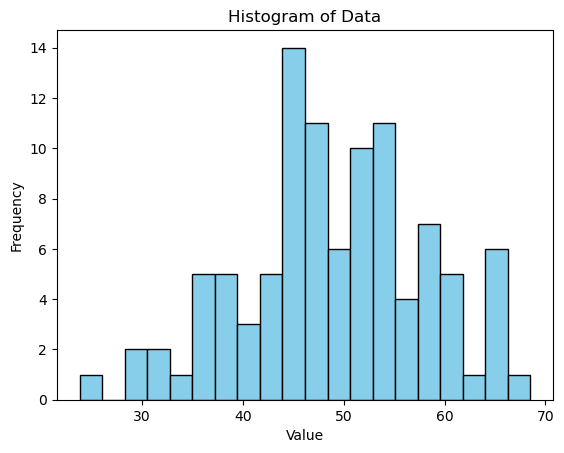

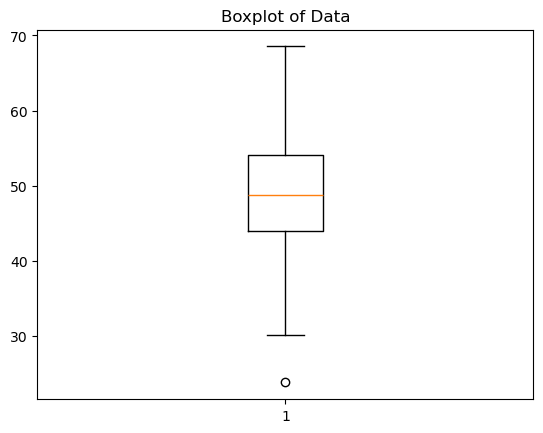

In [93]:
# Generate a random dataset
np.random.seed(42)
data = np.random.normal(loc=50, scale=10, size=100)

# Descriptive statistics
mean = np.mean(data)
median = np.median(data)
mode = stats.mode(data)[0]
std_dev = np.std(data)
variance = np.var(data)
range_data = np.max(data) - np.min(data)

print("Descriptive Statistics:")
print(f"Mean: {mean}")
print(f"Median: {median}")
print(f"Mode: {mode}")
print(f"Standard Deviation: {std_dev}")
print(f"Variance: {variance}")
print(f"Range: {range_data}")

# Inferential statistics (hypothesis testing)
t_statistic, p_value = stats.ttest_1samp(data, popmean=50)
print("\nInferential Statistics:")
print(f"T-statistic: {t_statistic}")
print(f"P-value: {p_value}")
if p_value < 0.05:
    print("Reject null hypothesis (significant result)")
else:
    print("Fail to reject null hypothesis (non-significant result)")
plt.hist(data, bins=20, color='skyblue', edgecolor='black')
plt.title('Histogram of Data')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.show()
plt.boxplot(data)
plt.title('Boxplot of Data')
plt.show()

## Creating  a Function to Train Model using Different Regression Algorithms.

Model: Random Forest
Training Score: 97.98%
Testing Score: 91.73%
R2: 0.92, Adjusted R2: 0.90
MAE: 14657.54, MSE: 404189413.34, RMSE: 20104.46




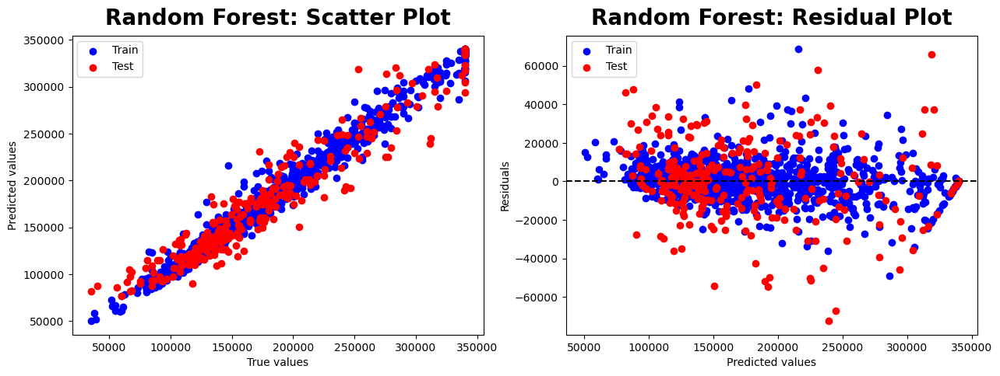

Model: Linear Regression
Training Score: 92.90%
Testing Score: 91.47%
R2: 0.91, Adjusted R2: 0.89
MAE: 14259.73, MSE: 417034409.07, RMSE: 20421.42




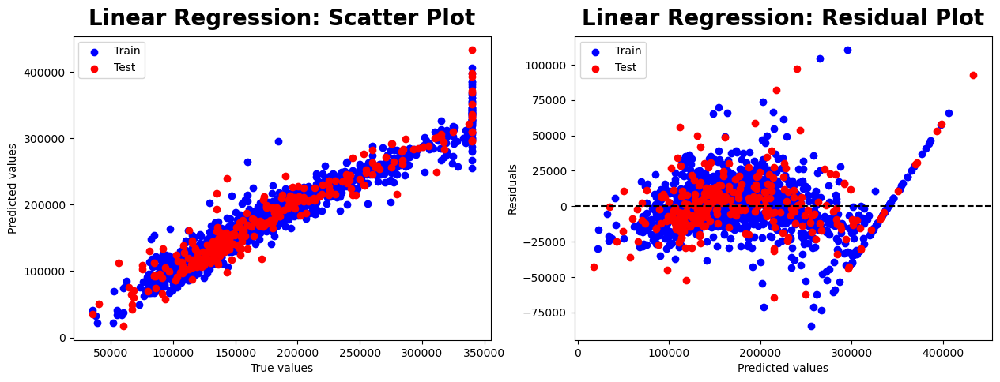

Model: Decision Tree
Training Score: 100.00%
Testing Score: 82.00%
R2: 0.82, Adjusted R2: 0.77
MAE: 20464.08, MSE: 879861638.64, RMSE: 29662.46




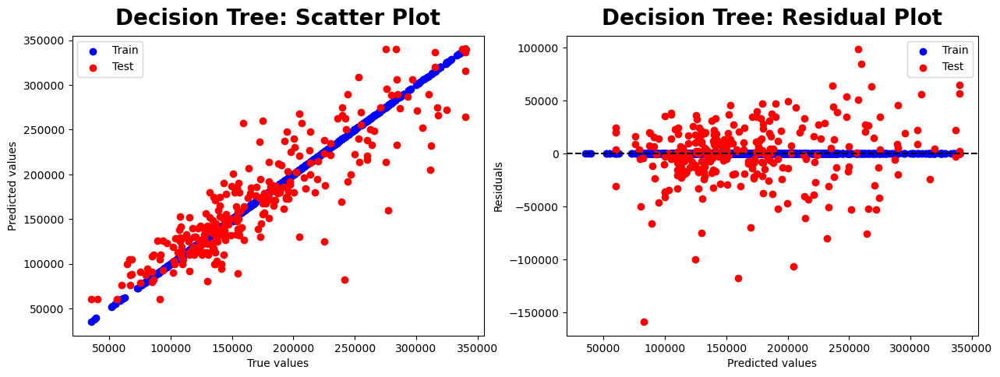

,Model,Training Score (%),Testing Score (%),MAE,MSE,RMSE,R2,Adjusted R2
0,Random Forest,97.980933,91.733100,14657.536267,4.041894e+08,20104.462523,0.917331,0.895406
1,Linear Regression,92.904676,91.470381,14259.729085,4.170344e+08,20421.420349,0.914704,0.892082
2,Decision Tree,99.999545,82.004159,20464.078767,8.798616e+08,29662.461776,0.820042,0.772313


In [121]:
model_scores = []

def evaluate_model_with_plot(model, model_name, X_train, y_train, X_test, y_test):
    model.fit(X_train, y_train)  

    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    
    mae = mean_absolute_error(y_test, y_test_pred)
    mse = mean_squared_error(y_test, y_test_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test, y_test_pred)
    adjusted_r2 = 1 - ((1 - r2) * (X_test.shape[0] - 1) / (X_test.shape[0] - X_test.shape[1] - 1))
    
    train_score = model.score(X_train, y_train) * 100
    test_score = model.score(X_test, y_test) * 100
    
    model_scores.append({
        "Model": model_name,
        "Training Score (%)": train_score,
        "Testing Score (%)": test_score,
        "MAE": mae,
        "MSE": mse,
        "RMSE": rmse,
        "R2": r2,
        "Adjusted R2": adjusted_r2
    })
    
    print(f"Model: {model_name}")
    print(f"Training Score: {train_score:.2f}%")
    print(f"Testing Score: {test_score:.2f}%")
    print(f"R2: {r2:.2f}, Adjusted R2: {adjusted_r2:.2f}")
    print(f"MAE: {mae:.2f}, MSE: {mse:.2f}, RMSE: {rmse:.2f}")
    print("\n")
    
    plt.figure(figsize=(15, 5))    
    plt.subplot(1, 2, 1)    
    plt.scatter(y_train, y_train_pred, color='blue', label='Train')
    plt.scatter(y_test, y_test_pred, color='red', label='Test')
    plt.xlabel('True values')
    plt.ylabel('Predicted values')
    plt.legend()
    plt.title(f'{model_name}: Scatter Plot', fontweight="bold", size=20, pad=10)
    
    plt.subplot(1, 2, 2)
    plt.scatter(y_train_pred, y_train_pred - y_train, color='blue', label='Train')
    plt.scatter(y_test_pred, y_test_pred - y_test, color='red', label='Test')
    plt.axhline(y=0, color='black', linestyle='--')
    plt.xlabel('Predicted values')
    plt.ylabel('Residuals')
    plt.legend()
    plt.title(f'{model_name}: Residual Plot', fontweight="bold", size=20, pad=10)
    plt.show()
def run_all_models_with_plot(models, X_train, y_train, X_test, y_test):
    for model_name, model in models.items():
        evaluate_model_with_plot(model, model_name, X_train, y_train, X_test, y_test)
models = {
    "Random Forest": RandomForestRegressor(n_estimators=10),
    "Linear Regression": LinearRegression(),
    "Decision Tree": DecisionTreeRegressor()
}
run_all_models_with_plot(models, X_train, y_train, X_test, y_test)
pd.DataFrame(model_scores)

### Random Forest Regressor Performance:** The Random Forest Regressor tends to perform well in various types of datasets due to its ability to handle non-linear relationships and high dimensionality. In this case, it outperformed the other models significantly, suggesting that the relationships between the features and the target variable are complex and possibly non-linear Here the score of Random Forest is better so we will go with Random Forest.

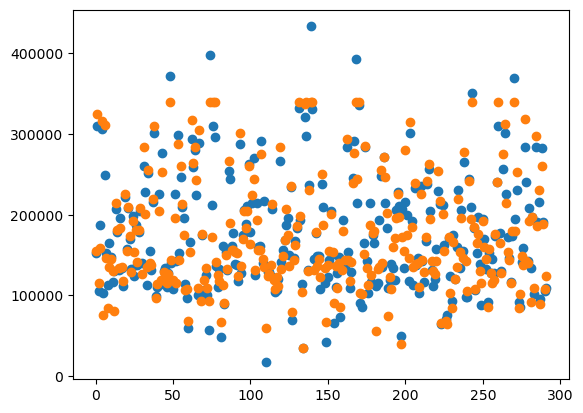

In [122]:
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
plt.scatter(range(len(y_pred)), y_pred)
plt.scatter(range(len(y_pred)),y_test)
plt.show()

In [125]:
test_predictions = RF.predict(X_test)

In [126]:
test_predictions

array([140530.  , 315987.5 , 116650.  , 167690.  , 294653.75,  79100.  ,
       217609.  , 154390.  ,  82000.  , 130210.  , 153770.  , 125100.  ,
        98275.  , 211934.5 , 181090.  , 136292.5 , 202515.  , 133940.  ,
       102870.  , 199960.  , 167220.  , 206083.  , 184208.  , 131990.  ,
       190399.  , 166620.  , 183019.5 ,  98415.  , 183518.5 , 189976.1 ,
       120765.  , 244709.  , 200377.  , 115300.  , 255717.8 , 145510.  ,
       145730.  , 211563.7 , 312972.  , 106190.  , 128875.  , 233730.  ,
       120400.  , 306174.05, 122680.  , 147290.  , 116680.  , 124680.  ,
       339633.75, 148675.  , 125060.  , 181715.  , 132855.  , 278070.55,
       139960.  , 229187.5 , 207985.6 , 154220.  , 141750.  , 108410.  ,
        78990.  , 147770.  , 311359.2 , 244909.  , 299951.25, 206600.  ,
       107450.  , 294433.75, 111690.  , 163400.  , 129967.3 , 129590.  ,
       109190.  ,  90780.  , 340037.5 , 176290.  , 318883.7 , 300675.  ,
       135435.  , 120950.  ,  93790.  ,  83488.3 , 

In [127]:
MAE = mean_absolute_error(y_test, test_predictions).round(3)
MSE = mean_squared_error(y_test, test_predictions).round(3)
RMSE = np.sqrt(mean_squared_error(y_test, test_predictions)).round(3)
print(f"MAE: {MAE}, MSE: {MSE}, RMSE: {RMSE}")

MAE: 14556.477, MSE: 427018801.544, RMSE: 20664.433


In [128]:
kf = KFold(n_splits=5, shuffle=True, random_state=42)  
cv_scores = cross_val_score(RF, X_train, y_train, cv=kf, scoring='neg_mean_squared_error')
cv_rmse_scores = np.sqrt(-cv_scores) 
print("Cross-validation RMSE scores:", cv_rmse_scores)
print("Mean cross-validation RMSE:", cv_rmse_scores.mean())

model.fit(X_train, y_train)
y_pred = RF.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse}')
print(f'R-squared: {r2}')
predictions_df = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
print("\nPredictions:")

predictions_df.to_csv('predictions.csv', index=False)

Cross-validation RMSE scores: [24483.72691128 23306.78352806 24104.1739034  22665.47582914
 22130.66307923]
Mean cross-validation RMSE: 23338.164650222687
Mean Squared Error: 427018801.54420364
R-squared: 0.912661695708594

Predictions:


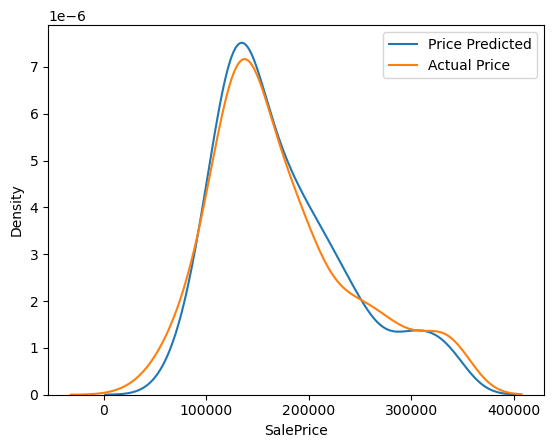

In [129]:
sns.kdeplot(data=test_predictions, label="Price Predicted")
sns.kdeplot(data=y_test, label="Actual Price")
plt.legend()
plt.show()

# <div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Verdana;text-align:center;display:fill;border-radius:5px;background-color:#254E58;overflow:hidden"><b>🎈 Conclusion 🎈</b></div>

<div style="border-radius:10px;border:black solid;padding: 15px;background-color:white;font-size:110%;text-align:left">
<div style="font-family:Georgia;background-color:'#DEB887'; padding:30px; font-size:17px">


<h3 align="left"><font color=purple>📝 Key Findings:</font></h3><br> 
2. The <b>best performing</b> model is <b>RandomforestRegressor</b> with <b>highest R2 & Adjusted_R2 Scores</b>